# El Fin (Final Exam) for AMPTH-2017/APMA E-207

**Harvard University**<br>
**Fall 2018**<br>
**Instructors: Rahul Dave**<br>
**Due Date:** Monday, December 17th, 2018 at 11:59pm

**Instructions:**

- Upload your final answers in the form of a Jupyter notebook containing all work to Canvas.

- Structure your notebook and your work to maximize readability.

### Collaborators

**Michelle (Chia Chi) Ho, Jiejun Lu, Jiawen Tong**

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import scipy.stats
from scipy.stats import multivariate_normal, bernoulli
import matplotlib.pyplot as plt
import seaborn.apionly as sns
from IPython.display import display

from theano import shared
import theano.tensor as tt
import pymc3 as pm
from pymc3 import Model

%matplotlib inline
sns.set_style('white')

warnings.filterwarnings('ignore')

## Q1: GLMs with correlation

### The dataset: A Bangladesh Contraception use census

This problem is based on one-two (12H1 and continuations ) from your textbook. The data is in the file `bangladesh.csv`. These data are from the 1988 Bangladesh Fertility Survey. Each row is one of 1934 women. There are six variables:

- (1) `district`: ID number of administrative district each woman resided in
- (2) `use.contraception`: An indicator (0/1) of whether the woman was using contraception
- (3) `urban`: An indicator (0/1) of whether the woman lived in a city, as opposed to living in a rural area
- (4) `woman`: a number indexing a single woman in this survey
- (5) `living.chidren`: the number of children living with a woman
- (6) `age.centered`: a continuous variable representing the age of the woman with the sample mean subtracted

We need to make sure that the cluster variable, district, is a contiguous set of integers, so that we can use the index to differentiate the districts easily while sampling ((look at the Chimpanzee models we did in lab to understand the indexing). So create a new contiguous integer index to represent the districts. Give it a new column in the dataframe, such as `district.id`.

You will be investigating the dependence of contraception use on the district in which the survey was done. Specifically, we will want to regularize estimates from those districts where very few women were surveyed. We will further want to investigate whether the areas of residence (urban or rural) within a district impacts a woman's use of contraception.

Feel free to indulge in any exploratory visualization which helps you understand the dataset better.

In [33]:
# load data
df_bang = pd.read_csv('bangladesh.csv', sep=';')
df_bang['district'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 55, 56, 57, 58, 59, 60, 61])

In [34]:
idx = df_bang[df_bang['district'] == 61].index
df_bang.loc[idx, 'district'] = 54
np.unique(df_bang['district'])

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60])

In [35]:
# re-index 'district'
df_bang['district_id'] = df_bang['district'] - 1
np.unique(df_bang['district_id'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59])

In [36]:
# discretize number of children
df_bang['many.children'] = np.zeros((len(df_bang),)).astype(int)
df_bang.loc[df_bang['living.children'] >= 2, 'many.children'] = 1
df_bang.head()

,woman,district,use.contraception,living.children,age.centered,urban,district_id,many.children
0,1,1,0,4,18.4400,1,0,1
1,2,1,0,1,-5.5599,1,0,0
2,3,1,0,3,1.4400,1,0,1
3,4,1,0,4,8.4400,1,0,1
4,5,1,0,1,-13.5590,1,0,0


## Part A

We will use `use.contraception` as a Bernoulli response variable. 

When we say "fit" below, we mean, specify the model, plot its graph, sample from it, do some tests, and forest-plot and summarize the posteriors, at the very least.

**A1** Fit a traditional "fixed-effects" model which sets up district-specific intercepts, each with its own Normal(0, 10) prior. That is, the intercept is modeled something like 

```python
alpha_district = pm.Normal('alpha_district', 0, 10, shape=num_districts)
p=pm.math.invlogit(alpha_district[df.district_id])
```

Why should there not be any overall intercept in this model? 

<font color='blue'>
**A1**
<br>
Since a "fixed-effects" model fits district-specific intercepts, there should not be a redundant overall intercept.

In [37]:
with Model() as model_a_fix:
    a_district = pm.Normal('a_district', 0, 10, shape=df_bang['district_id'].nunique()) 
    logit_p = a_district[df_bang['district_id'].values]
    p = pm.Deterministic('p', pm.math.invlogit(logit_p))
    Y = pm.Bernoulli('Y', p=p, observed=df_bang['use.contraception'].values)

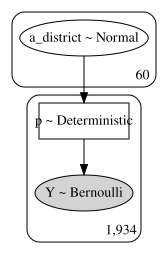

In [38]:
pm.model_to_graphviz(model_a_fix)

In [39]:
with model_a_fix:
    tr_a_fix = pm.sample(5000, tune=500)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [a_district]
Sampling 2 chains: 100%|██████████| 11000/11000 [00:46<00:00, 238.70draws/s]


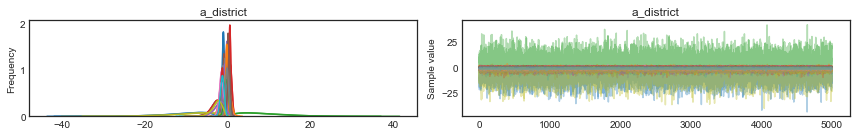

In [40]:
pm.traceplot(tr_a_fix, varnames=['a_district'])
plt.tight_layout()

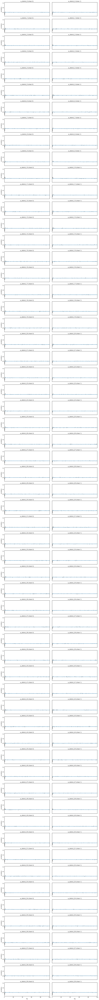

In [41]:
pm.autocorrplot(tr_a_fix, varnames=['a_district'])
plt.tight_layout()

In [42]:
pm.summary(tr_a_fix)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
a_district__0,-1.077897,0.213746,0.001573,-1.485854,-0.652898,16616.550021,1.000016
a_district__1,-0.649939,0.481652,0.003771,-1.569219,0.307419,16839.381289,0.999922
a_district__2,8.430592,5.927119,0.065290,-0.679011,20.349735,7080.479580,0.999918
a_district__3,0.000465,0.373795,0.002513,-0.711437,0.742308,16175.764737,0.999913
a_district__4,-0.597008,0.334201,0.002634,-1.234438,0.065569,14898.310814,0.999901
a_district__5,-0.898969,0.277444,0.002019,-1.466567,-0.384355,17355.827589,0.999900
a_district__6,-1.010080,0.554010,0.004799,-2.163761,0.021278,16536.837659,0.999900
a_district__7,-0.510494,0.349304,0.002545,-1.214923,0.151123,16187.971722,0.999921
a_district__8,-0.862672,0.467279,0.004047,-1.778482,0.032766,13693.623209,0.999940
a_district__9,-2.946051,1.256618,0.013291,-5.433680,-0.781868,8329.817903,1.000024


In [43]:
pm.waic(tr_a_fix, model_a_fix)

WAIC_r(WAIC=2534.1052703055075, WAIC_se=33.00716634347753, p_WAIC=62.98607409402111, var_warn=1)

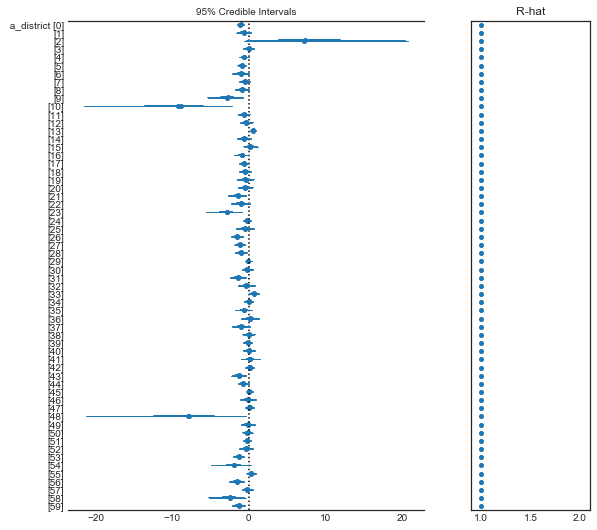

In [44]:
fig, ax = plt.subplots(figsize=(10, 8))
pm.forestplot(tr_a_fix, varnames=['a_district'])
plt.tight_layout()

<font color='blue'>
All parameters have mostly `Rhat = 1`, indicating convergence.

In [45]:
def sigmoid(logit):
    return 1 / (1 + np.exp(-logit))

# predictions
p_pred_a_fix = sigmoid(tr_a_fix['a_district']).mean(0)

# posterior predictive draws
Y_a_fix = pm.sample_ppc(tr_a_fix, samples=10000, model=model_a_fix)

100%|██████████| 10000/10000 [00:08<00:00, 1112.28it/s]


**A2** Fit a multi-level "varying-effects" model with an overall intercept `alpha`, and district-specific intercepts `alpha_district`. Assume that the overall intercept has a Normal(0, 10) prior, while the district specific intercepts are all drawn from the **same** normal distribution with mean 0 and standard deviation $\sigma$. Let $\sigma$ be drawn from HalfCauchy(2). The setup of this model is similar to the per-chimanzee models in the prosocial chimanzee labs.

In [46]:
with Model() as model_a:
    sigma = pm.HalfCauchy('sigma', 2, shape=1)
    a = pm.Normal('a', 0, 10, shape=1)   
    a_district = pm.Normal('a_district', 0, sigma, shape=df_bang['district_id'].nunique())
    logit_p = a + a_district[df_bang['district_id'].values]
    p = pm.Deterministic('p', pm.math.invlogit(logit_p))
    Y = pm.Bernoulli('Y', p=p, observed=df_bang['use.contraception'].values)

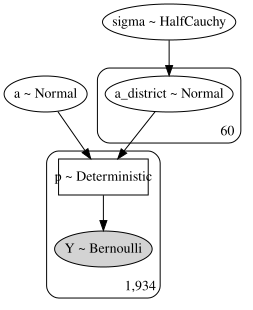

In [47]:
pm.model_to_graphviz(model_a)

In [48]:
with model_a:
    tr_a = pm.sample(5000, tune=500)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [a_district, a, sigma]
Sampling 2 chains: 100%|██████████| 11000/11000 [00:34<00:00, 315.57draws/s]


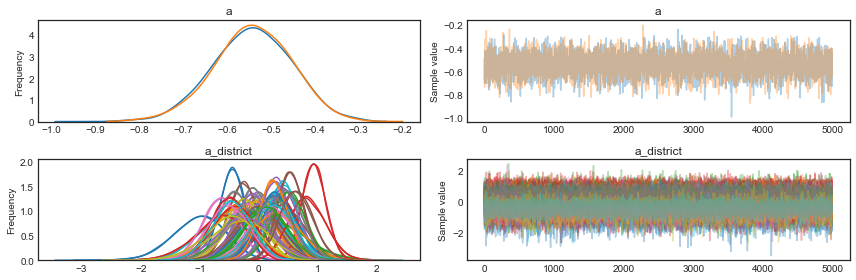

In [49]:
pm.traceplot(tr_a, varnames=['a', 'a_district'])
plt.tight_layout()

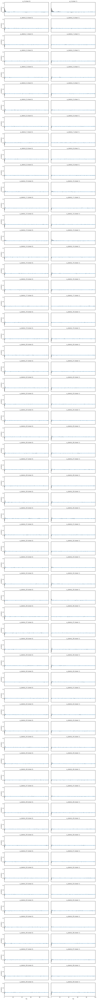

In [50]:
pm.autocorrplot(tr_a, varnames=['a', 'a_district'])
plt.tight_layout()

In [51]:
pm.summary(tr_a)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
a__0,-0.541631,0.088258,0.001555,-0.718430,-0.376516,3305.006128,1.000026
a_district__0,-0.452236,0.207968,0.001915,-0.864377,-0.056982,10071.512858,0.999902
a_district__1,-0.058513,0.357293,0.003343,-0.748039,0.654834,11372.821544,1.000054
a_district__2,0.301642,0.501730,0.004808,-0.724610,1.267544,12239.025410,0.999905
a_district__3,0.357604,0.306584,0.002983,-0.219123,0.977486,10826.623067,1.000015
a_district__4,-0.033214,0.288555,0.002647,-0.609580,0.520417,12979.950268,0.999928
a_district__5,-0.272561,0.245138,0.002153,-0.764046,0.193026,10526.889816,0.999907
a_district__6,-0.218942,0.364300,0.002791,-0.944042,0.491671,12841.807660,0.999930
a_district__7,0.029695,0.289193,0.003434,-0.539234,0.584290,10818.281462,0.999913
a_district__8,-0.171292,0.341821,0.002809,-0.840228,0.487984,13372.819163,0.999900


In [52]:
pm.waic(tr_a, model_a)

WAIC_r(WAIC=2514.0375907240295, WAIC_se=25.06201103639458, p_WAIC=35.59521480967342, var_warn=0)

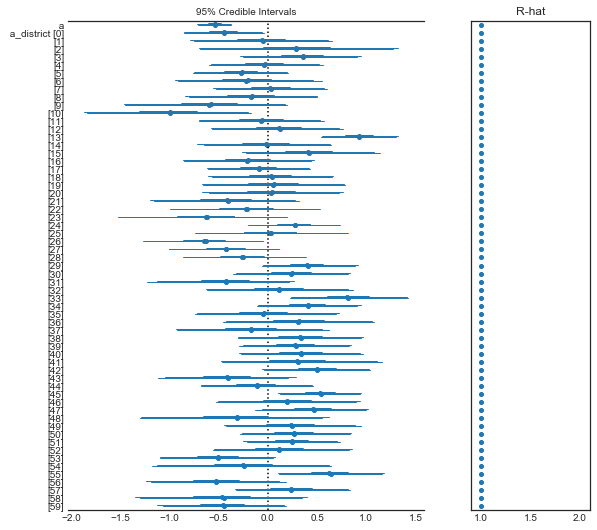

In [53]:
fig, ax = plt.subplots(figsize=(10, 8))
pm.forestplot(tr_a, varnames=['a', 'a_district'])
plt.tight_layout()

<font color='blue'>
All parameters have mostly `Rhat = 1`, indicating convergence.

In [54]:
# prediction
p_pred_a = sigmoid(tr_a['a_district']).mean(0)

# pp samples
Y_a = pm.sample_ppc(tr_a, samples=10000, model=model_a)

100%|██████████| 10000/10000 [00:11<00:00, 840.31it/s]


**A3** What does a posterior-predictive sample in this model look like? What is the difference between district specific posterior predictives and woman specific posterior predictives. In other words, how might you model the posterior predictive for a new woman being from a particular district vs that os a new woman in the entire sample? This is a word answer; no programming required.

<font color='blue'>
**A3**
<br>
For district specific model, the posterior predictive is a draw from a Bernoulli distribution where p = inverse logit of the district specific intercept. On the other hand, for women specific model, the posterior predictive is a draw from a Bernoulli distribution where p = inverse logit of the overall intercept. 

**A4** Plot the predicted proportions of women in each district using contraception against the id of the district, in both models. How do these models disagree? Look at the extreme values of predicted contraceptive use in the fixed effects model. How is the disagreement in these cases?

In [55]:
df_pred_diff = df_bang[['district_id', 'use.contraception', 'woman']].copy()

# predicted proportion - mean pp samples
df_pred_diff['pp_fix'] = Y_a_fix['Y'].mean(axis=0)
df_pred_diff['pp_vary'] = Y_a['Y'].mean(axis=0)
df_pred_group = df_pred_diff.groupby('district_id')['use.contraception', 'pp_fix', 'pp_vary'].agg('mean')

# predicted proportion - mean posterior
df_pred_group['post_fix'] = p_pred_a_fix
df_pred_group['post_vary'] = p_pred_a

# number of woman by district
df_pred_group['n_woman'] = df_bang.groupby('district_id')['woman'].agg(len)

display(df_pred_group.head())

,use.contraception,pp_fix,pp_vary,post_fix,post_vary,n_woman
district_id,,,,,,
0,0.256410,0.256597,0.271423,0.256008,0.389964,117
1,0.350000,0.349535,0.358650,0.350665,0.485859,20
2,1.000000,0.956000,0.443600,0.957375,0.570517,2
3,0.500000,0.500570,0.453963,0.500111,0.586513,30
4,0.358974,0.356523,0.364282,0.358604,0.491894,39


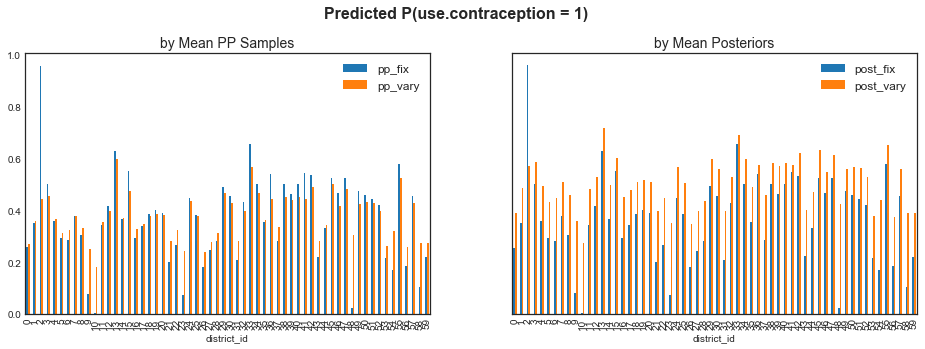

In [56]:
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(16, 5))
plt.suptitle('Predicted P(use.contraception = 1)', fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.85)

# plot predicted proportion - mean pp samples
df_pred_group[['pp_fix', 'pp_vary']].plot(kind='bar', ax=ax[0])
ax[0].set_title('by Mean PP Samples', fontsize=14)

# plot predicted proportion - mean posterior
df_pred_group[['post_fix', 'post_vary']].plot(kind='bar', ax=ax[1])
ax[1].set_title('by Mean Posteriors', fontsize=14)

ax[0].legend(fontsize=12)
ax[1].legend(fontsize=12)
plt.show()

<font color='blue'>
**A4**
<br>
These models disagree most in the districts with fewer samples (e.g. district 2 and 48 with 2 and 4 samples, respectively). The fixed effect model is more likely to give extreme values (close to 1 or close to 0) because it is more likely to be overwhelmed by distrit specific data while the varying effect model's predictions are more moderate across the distrcits. For instance, for distrcit 2, the fixed effect model predicts close to 1 while the varying effect model predicts close to 0.5. This can be attributed to the statistical strength sharing in the varying effect model.
</font>

**A5** Plot the absolute value of the difference in probability of contraceptive use against the number of women sampled in each district. What do you see?

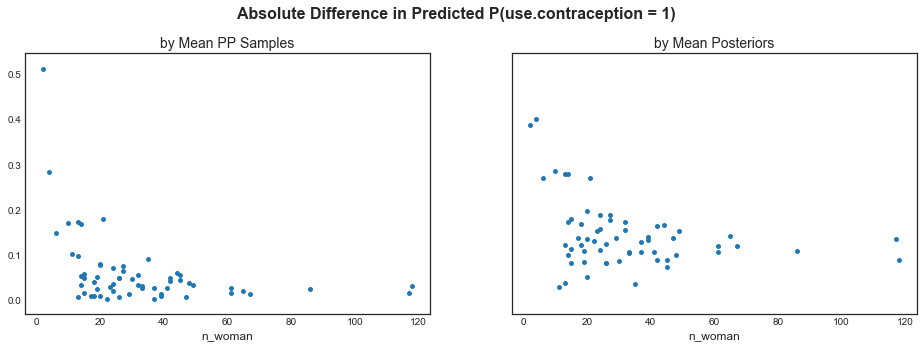

In [57]:
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(16, 5))
plt.suptitle('Absolute Difference in Predicted P(use.contraception = 1)', fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.85)

abs_diff_pp = (df_pred_group['pp_fix'] - df_pred_group['pp_vary']).abs()
ax[0].scatter(x=df_pred_group['n_woman'], y=abs_diff_pp, s=15)
ax[0].set_title('by Mean PP Samples', fontsize=14)

abs_diff_post = (df_pred_group['post_fix'] - df_pred_group['post_vary']).abs()
ax[1].scatter(x=df_pred_group['n_woman'], y=abs_diff_post, s=15)
ax[1].set_title('by Mean Posteriors', fontsize=14)

ax[0].set_xlabel('n_woman', fontsize=12)
ax[1].set_xlabel('n_woman', fontsize=12)
plt.show()

<font color='blue'>
**A5**
<br>
The districts with fewer number of women showed larger difference in the probability of contraceptive use. Refer to A4 for the explanation of this observation.
</font>

## Part B.

Let us now fit a model with both varying intercepts by `district_id` (like we did in the varying effects model above) and varying slopes of `urban` by `district_id`. To do this, we will 

- (a) have an overall intercept, call it `alpha`
- (b) have an overall slope of `urban`, call it `beta`.
- (c) have district specific intercepts `alpha_district`
- (d) district specific slopes for `urban`, `beta_district`
- (e) model the co-relation between these slopes and intercepts. 

We have not modelled covariance and correlation before, so look at http://am207.info/wiki/corr.html for notes on how this is done.

To see the ideas behind this, see section 13.2.2 on the income data  from your textbook (included as a pdf in this zip). Feel free to use [code with attribution from Osvaldo Martin](https://github.com/aloctavodia/Statistical-Rethinking-with-Python-and-PyMC3/blob/master/Chp_13.ipynb)..with attribution and understanding...there is some sweet pymc3 technical wrangling in there.

**B1** Write down the model as a pymc3 specification and look at its graph. Note that this model builds a 60 by 2 matrix with `alpha_district` values in the first column and `beta_district` values in the second. By assumption, the first column and the second column have correlation structure given by an LKJ prior, but there is no explicit correlation among the rows. In other words, the correlation matrix is 2x2 (not 60x60). Make sure to obtain the value of the off-diagonal correlation as a `pm.Deterministic`. (See Osvaldo Martin's code above)

<font color='blue'>
We referenced the implementation of correlation modeling from this [notebook](https://github.com/aloctavodia/Statistical-Rethinking-with-Python-and-PyMC3/blob/master/Chp_13.ipynb).
</font>

In [58]:
with Model() as model_urban:
    # overall alpha & beta
    a = pm.Normal('a', 0, 10)
    b = pm.Normal('b', 0, 1)
    
    # prior on correlation
    packed_L = pm.LKJCholeskyCov('packed_L', eta=2, n=2, sd_dist=pm.HalfCauchy.dist(beta=2))
    
    # compute the covariance matrix
    L = pm.expand_packed_triangular(2, packed_L, lower=True)
    cov = tt.dot(L, L.T)
    
    # Extract the standard deviations and rho
    sigma_ab = pm.Deterministic('sigma_ab', tt.sqrt(tt.diag(cov)))
    corr = tt.diag(sigma_ab**-1).dot(cov.dot(tt.diag(sigma_ab**-1)))
    R = pm.Deterministic('R', corr[np.triu_indices(2, k=1)])
    
    # district specific alpha & beta 
    mu = pm.MvNormal('mu', mu=tt.stack([a, b]), chol=L, shape=(60, 2))
    a_district = pm.Deterministic('a_district', mu[:, 0])
    b_urban = pm.Deterministic('b_urban', mu[:, 1])
    
    # p = invlogit(a_district + b_urban * urban)
    logit_p = mu[df_bang['district_id'].values, 0] + \
              mu[df_bang['district_id'].values, 1] * df_bang['urban'].values
    
    p = pm.Deterministic('p', pm.math.invlogit(logit_p))
    Y = pm.Bernoulli('Y', p=p, observed=df_bang['use.contraception'].values)

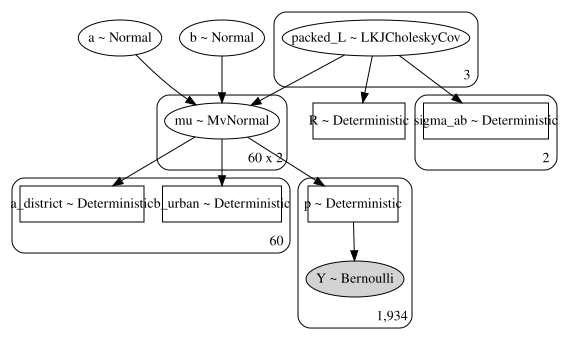

In [59]:
pm.model_to_graphviz(model_urban)

**B2**: Sample from the posterior of the model above *with a target acceptance rate of .9 or more*. (Sampling takes me 7 minutes 30 seconds on my 2013 Macbook Air). Comment on the quality of the samples obtained.

In [108]:
with model_urban:
    tr_urban = pm.sample(5000, tune=500, target_accept=0.9, cores=-1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [mu, packed_L, b, a]
100%|██████████| 5500/5500 [04:39<00:00, 19.69it/s]
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.
The number of effective samples is smaller than 25% for some parameters.


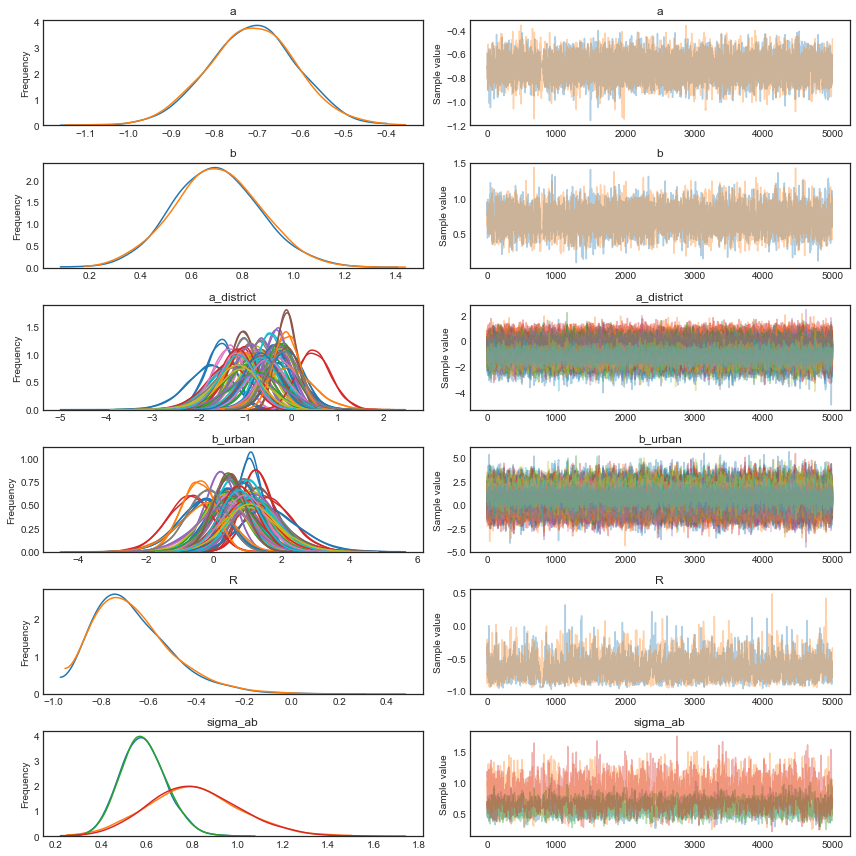

In [109]:
pm.traceplot(tr_urban, varnames=['a', 'b', 'a_district', 'b_urban', 'R', 'sigma_ab'])
plt.tight_layout()

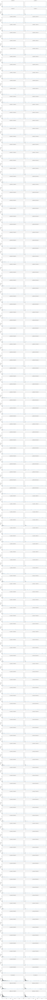

In [110]:
pm.autocorrplot(tr_urban, varnames=['a', 'b', 'a_district', 'b_urban', 'R', 'sigma_ab'])
plt.tight_layout()

In [111]:
pm.summary(tr_urban)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
a,-0.712714,0.101666,0.001037,-0.908285,-0.514259,7397.929143,1.000029
b,0.700361,0.171668,0.002245,0.357831,1.036853,5674.640583,1.000093
mu__0_0,-1.543759,0.316342,0.003776,-2.174724,-0.946099,8894.885541,1.000161
mu__0_1,1.075662,0.391337,0.004620,0.294352,1.836075,9132.169073,0.999920
mu__1_0,-0.667483,0.369226,0.003430,-1.381269,0.054416,11245.373189,1.000222
mu__1_1,0.655756,0.706770,0.005935,-0.674628,2.143408,12202.684260,1.000010
mu__2_0,-0.690743,0.603980,0.005588,-1.908778,0.453132,10069.599854,1.000112
mu__2_1,1.007689,0.830667,0.009020,-0.566507,2.774324,8558.011218,1.000006
mu__3_0,-0.880936,0.406675,0.004984,-1.679500,-0.097520,7008.692665,0.999909
mu__3_1,1.687540,0.665870,0.011006,0.443422,3.023031,3666.128757,0.999960


In [112]:
pm.waic(tr_urban, model_urban)

WAIC_r(WAIC=2467.7426780417263, WAIC_se=28.183060628512127, p_WAIC=52.53114684003935, var_warn=0)

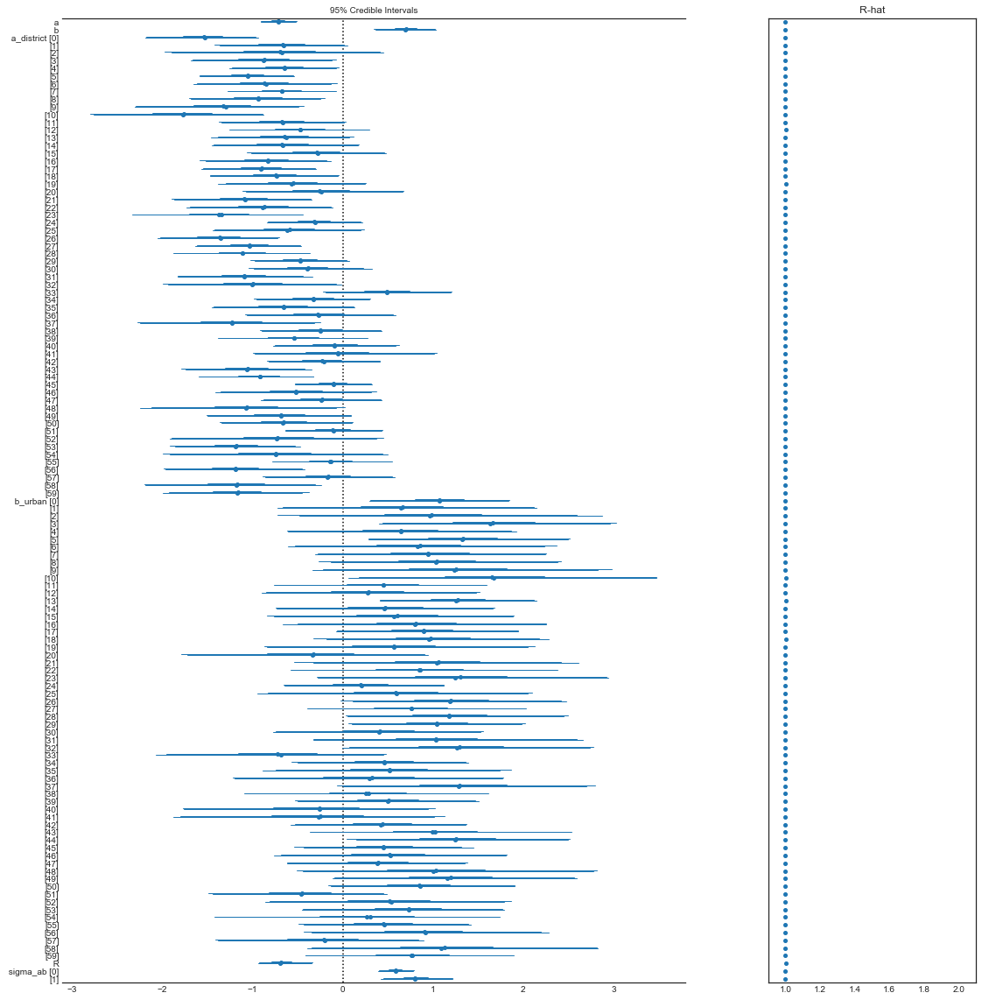

In [113]:
fig, ax = plt.subplots(figsize=(20, 18))
pm.forestplot(tr_urban, varnames=['a', 'b', 'a_district', 'b_urban', 'R', 'sigma_ab'])
plt.tight_layout()

<font color='blue'>
**B2**
<br>
The number of effective samples for some parameters is relatively low, indicating the samples being correlated or in poor quality.

**B3** Propose a method based on the reparametrization trick for multi-variate gaussians) of improving the quality of the samples obtained and implement it. (A hint can be obtained from here: https://docs.pymc.io/api/distributions/multivariate.html#pymc3.distributions.multivariate.MvNormal . Using that hint lowered the sampling time to 2.5 minutes on my laptop).

In [66]:
with Model() as model_urban_trick:
    # overall intercept & slope
    a = pm.Normal('a', 0, 10)
    b = pm.Normal('b', 0, 1)
    
    # prior on correlations
    packed_L = pm.LKJCholeskyCov('packed_L', eta=2, n=2, sd_dist=pm.HalfCauchy.dist(beta=2))
    
    # compute the covariance matrix
    L = pm.expand_packed_triangular(2, packed_L, lower=True)
    cov = tt.dot(L, L.T)
    
    # Extract the standard deviations and R
    sigma_ab = pm.Deterministic('sigma_ab', tt.sqrt(tt.diag(cov)))
    corr = tt.diag(sigma_ab**-1).dot(cov.dot(tt.diag(sigma_ab**-1)))
    R = pm.Deterministic('R', corr[np.triu_indices(2, k=1)])
    
    # district specific intercepts & slopes - implementation with TRICK
    mu_raw = pm.Normal('mu_raw', mu=0, sd=1, shape=(60, 2))
    mu = pm.Deterministic('mu', tt.stack([a, b]) + tt.dot(L, mu_raw.T).T)
    a_district = pm.Deterministic('a_district', mu[:, 0])
    b_urban = pm.Deterministic('b_urban', mu[:, 1])
    
    # p = invlogit(a_district + b_urban * urban + c_district * age.centered)
    logit_p = mu[df_bang['district_id'].values, 0] + \
              mu[df_bang['district_id'].values, 1] * df_bang['urban'].values
    
    p = pm.Deterministic('p', pm.math.invlogit(logit_p))
    Y = pm.Bernoulli('Y', p=p, observed=df_bang['use.contraception'].values)

In [67]:
with model_urban_trick:
    tr_urban_trick = pm.sample(5000, tune=500, target_accept=0.9, cores=-1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [mu_raw, packed_L, b, a]
100%|██████████| 5500/5500 [01:48<00:00, 50.58it/s]


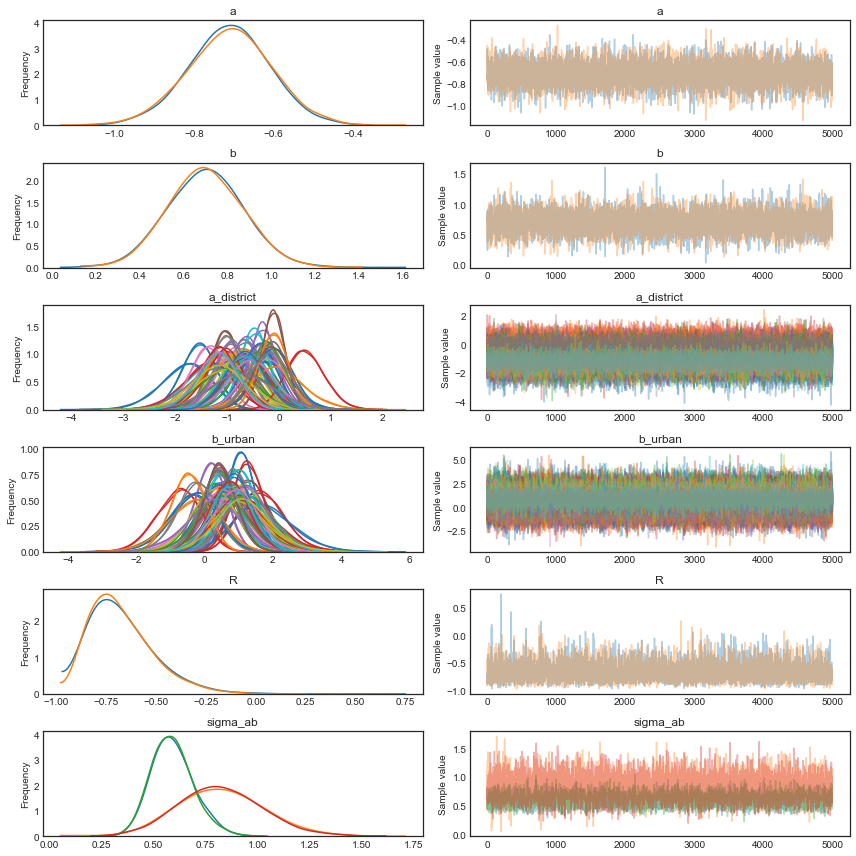

In [68]:
pm.traceplot(tr_urban_trick, varnames=['a', 'b', 'a_district', 'b_urban', 'R', 'sigma_ab'])
plt.tight_layout()

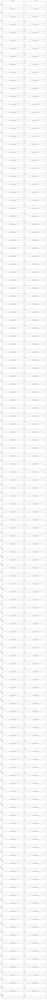

In [69]:
pm.autocorrplot(tr_urban_trick, varnames=['a', 'b', 'a_district', 'b_urban', 'R', 'sigma_ab'])
plt.tight_layout()

In [70]:
pm.summary(tr_urban_trick)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
a,-0.710903,0.102943,0.001328,-0.922352,-0.513311,7200.339205,0.999981
b,0.701305,0.171179,0.001995,0.369600,1.031723,8442.143479,0.999928
mu_raw__0_0,-1.442695,0.551287,0.004560,-2.505634,-0.396093,13225.634795,0.999928
mu_raw__0_1,-0.708154,0.644995,0.006483,-1.959607,0.591197,8479.892324,0.999922
mu_raw__1_0,0.072415,0.639096,0.004819,-1.160560,1.345015,19433.370610,1.000209
mu_raw__1_1,0.005889,0.999856,0.006370,-1.984674,1.888441,24905.881104,1.000114
mu_raw__2_0,0.032525,0.988507,0.007268,-1.876696,1.942539,17722.873203,0.999952
mu_raw__2_1,0.499578,0.944899,0.006198,-1.425540,2.282071,17926.851946,0.999914
mu_raw__3_0,-0.290616,0.696912,0.005170,-1.641519,1.082336,15103.186401,0.999984
mu_raw__3_1,1.360943,0.778563,0.005357,-0.144438,2.914110,18885.480862,0.999918


In [71]:
pm.waic(tr_urban_trick, model_urban_trick)

WAIC_r(WAIC=2467.6873796050845, WAIC_se=28.213114756262705, p_WAIC=52.773880718437105, var_warn=0)

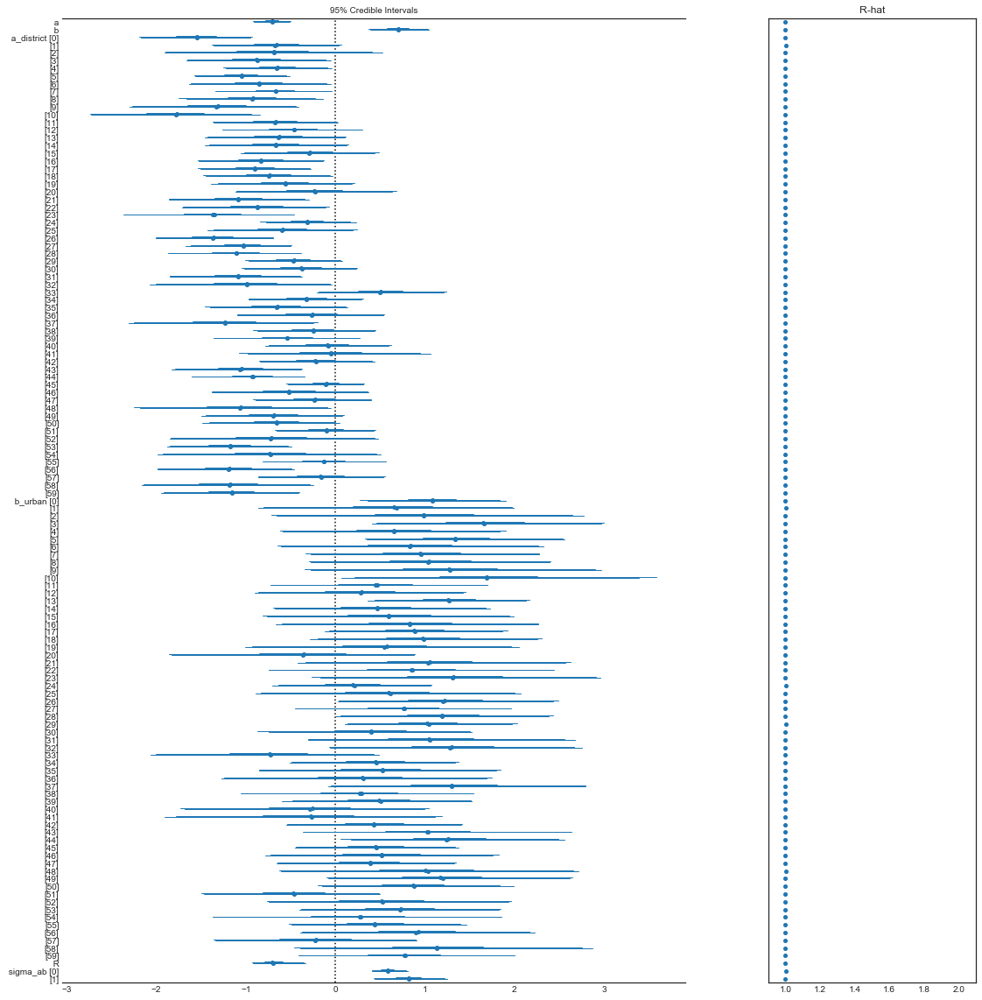

In [72]:
fig, ax = plt.subplots(figsize=(20, 18))
pm.forestplot(tr_urban_trick, varnames=['a', 'b', 'a_district', 'b_urban', 'R', 'sigma_ab'])
plt.tight_layout()

<font color='blue'>
**B3**
<br>
We used non-centered parameterization as suggested in the hint, as our reparametrization trick for multi-variate gaussians. This help lowered the sampling time from around 6 minutes to 4 minutes. In addition, our samples quality improves as the number of effective samples is higher for most of parameters.

**B4** Inspect the trace of the correlation between the intercepts and slopes, plotting the correlation marginal. What does this correlation tell you about the pattern of contraceptive use in the sample? It might help to plot the mean (or median) varying effect estimates for both the intercepts and slopes, by district. Then you can visualize the correlation and maybe more easily think through what it means to have a particular correlation. Also plot the predicted proportion of women using contraception, with urban women on one axis and rural on the other.  Finally, also plot the difference between urban and rural probabilities against rural probabilities. All of these will help you interpret your findings. (Hint: think in terms of low or high rural contraceptive use)

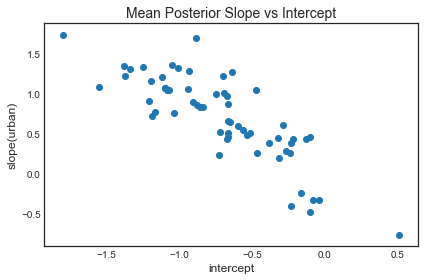

In [73]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax.scatter(x=tr_urban_trick['a_district'].mean(axis=0), y=tr_urban_trick['b_urban'].mean(axis=0))
ax.set_xlabel('intercept', fontsize=12)
ax.set_ylabel('slope(urban)', fontsize=12)
ax.set_title('Mean Posterior Slope vs Intercept', fontsize=14)
plt.tight_layout()

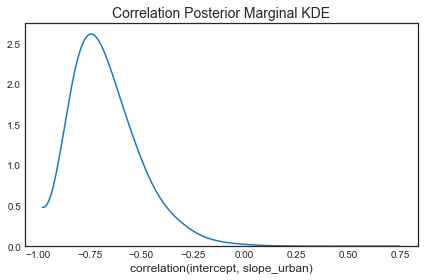

In [74]:
# correlation marginals
pm.kdeplot(tr_urban_trick['R'])
plt.title('Correlation Posterior Marginal KDE', fontsize=14)
plt.xlabel('correlation(intercept, slope_urban)', fontsize=12)
plt.tight_layout()

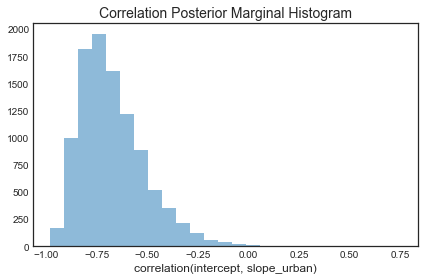

In [75]:
# correlation marginals
plt.hist(tr_urban_trick['R'], alpha=0.5, bins=25)
plt.title('Correlation Posterior Marginal Histogram', fontsize=14)
plt.xlabel('correlation(intercept, slope_urban)', fontsize=12)
plt.tight_layout()

In [76]:
# predictions - mean posteriors
post_rural = sigmoid(tr_urban_trick['a_district']).mean(axis=0)
post_urban = sigmoid(tr_urban_trick['a_district'] + tr_urban_trick['b_urban']).mean(axis=0)

# predictions - mean posterior predictives
pp_rural = bernoulli.rvs(p=sigmoid(tr_urban_trick['a_district'])).mean(axis=0)
pp_urban = bernoulli.rvs(p=sigmoid(tr_urban_trick['a_district'] + tr_urban_trick['b_urban'])).mean(axis=0)

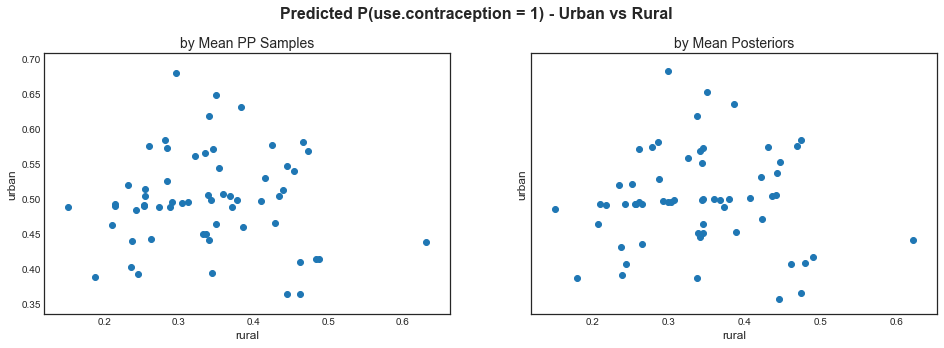

In [77]:
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(16, 5))
plt.suptitle('Predicted P(use.contraception = 1) - Urban vs Rural', fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.85)

ax[0].scatter(x=pp_rural, y=pp_urban)
ax[0].set_xlabel('rural', fontsize=12)
ax[0].set_ylabel('urban', fontsize=12)
ax[0].set_title('by Mean PP Samples', fontsize=14)

ax[1].scatter(x=post_rural, y=post_urban)
ax[1].set_xlabel('rural', fontsize=12)
ax[1].set_ylabel('urban', fontsize=12)
ax[1].set_title('by Mean Posteriors', fontsize=14)
plt.show()

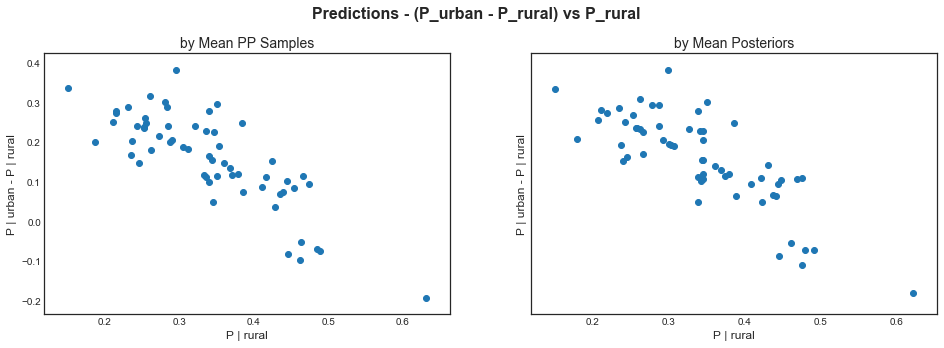

In [78]:
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(16, 5))
plt.suptitle('Predictions - (P_urban - P_rural) vs P_rural', fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.85)

ax[0].scatter(x=pp_rural, y=pp_urban - pp_rural)
ax[0].set_xlabel('P | rural', fontsize=12)
ax[0].set_ylabel('P | urban - P | rural', fontsize=12)
ax[0].set_title('by Mean PP Samples', fontsize=14)

ax[1].scatter(x=post_rural, y=post_urban - post_rural)
ax[1].set_xlabel('P | rural', fontsize=12)
ax[1].set_ylabel('P | urban - P | rural', fontsize=12)
ax[1].set_title('by Mean Posteriors', fontsize=14)
plt.show()

<font color='blue'>
**B4**
<br>
Based on the mean posterior estimtates and their correlation marginals, the intercepts and the slopes mostly have a negative correlation (-0.75). 

The interpretation is that urban area has overall higher contraceptive usage compared to rural area. In districts where rural area has higher average usage, the difference in contraceptive usage between urban and rural cities is smaller. Similarly, a district with lower average contraceptive use level for rural area has higher (positive) difference in urban/rural contraceptive use. This is intutivie because urban areas often are more progressive and tend to have more prevasive awareness of contraceptive use.    


**B5** Add additional "slope" terms (one-by-one) into the model for 

- (a) the centered-age of the women and 
- (b) an indicator for whether the women have a small number or large number of existing kids in the house (you can treat 1-2 kids as low, 3-4 as high, but you might want to experiment with this split). 

Are any of these effects significant? Are any significant effects similar over the urban/rural divide?

In [79]:
with Model() as model_urban_age:
    # overall intercept & slope
    a = pm.Normal('a', 0, 10)
    b = pm.Normal('b', 0, 1)
    b_age = pm.Normal('b_age', 0, 1, shape=60)
    
    # prior on correlations
    packed_L = pm.LKJCholeskyCov('packed_L', eta=2, n=2, sd_dist=pm.HalfCauchy.dist(beta=2))
    
    # compute the covariance matrix
    L = pm.expand_packed_triangular(2, packed_L, lower=True)
    cov = tt.dot(L, L.T)
    
    # Extract the standard deviations and R
    sigma_ab = pm.Deterministic('sigma_ab', tt.sqrt(tt.diag(cov)))
    corr = tt.diag(sigma_ab**-1).dot(cov.dot(tt.diag(sigma_ab**-1)))
    R = pm.Deterministic('R', corr[np.triu_indices(2, k=1)])
    
    # district specific intercepts & slopes
    mu_raw = pm.Normal('mu_raw', mu=0, sd=1, shape=(60, 2))
    mu = pm.Deterministic('mu', tt.stack([a, b]) + tt.dot(L, mu_raw.T).T)
    a_district = pm.Deterministic('a_district', mu[:, 0])
    b_urban = pm.Deterministic('b_urban', mu[:, 1])
    
    # p = invlogit(a_district + b_urban * urban + b_age * age.centered)
    logit_p = mu[df_bang['district_id'].values, 0] + \
              mu[df_bang['district_id'].values, 1] * df_bang['urban'].values + \
              b_age[df_bang['district_id'].values] * df_bang['age.centered'].values
    
    p = pm.Deterministic('p', pm.math.invlogit(logit_p))
    Y = pm.Bernoulli('Y', p=p, observed=df_bang['use.contraception'].values)

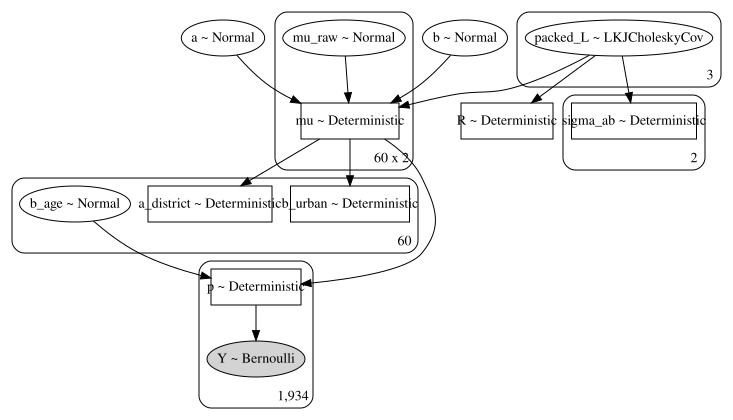

In [80]:
pm.model_to_graphviz(model_urban_age)

In [81]:
with model_urban_age:
    tr_urban_age = pm.sample(5000, tune=500, target_accept=0.9, cores=-1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [mu_raw, packed_L, b_age, b, a]
100%|██████████| 5500/5500 [02:44<00:00, 33.49it/s]
The estimated number of effective samples is smaller than 200 for some parameters.


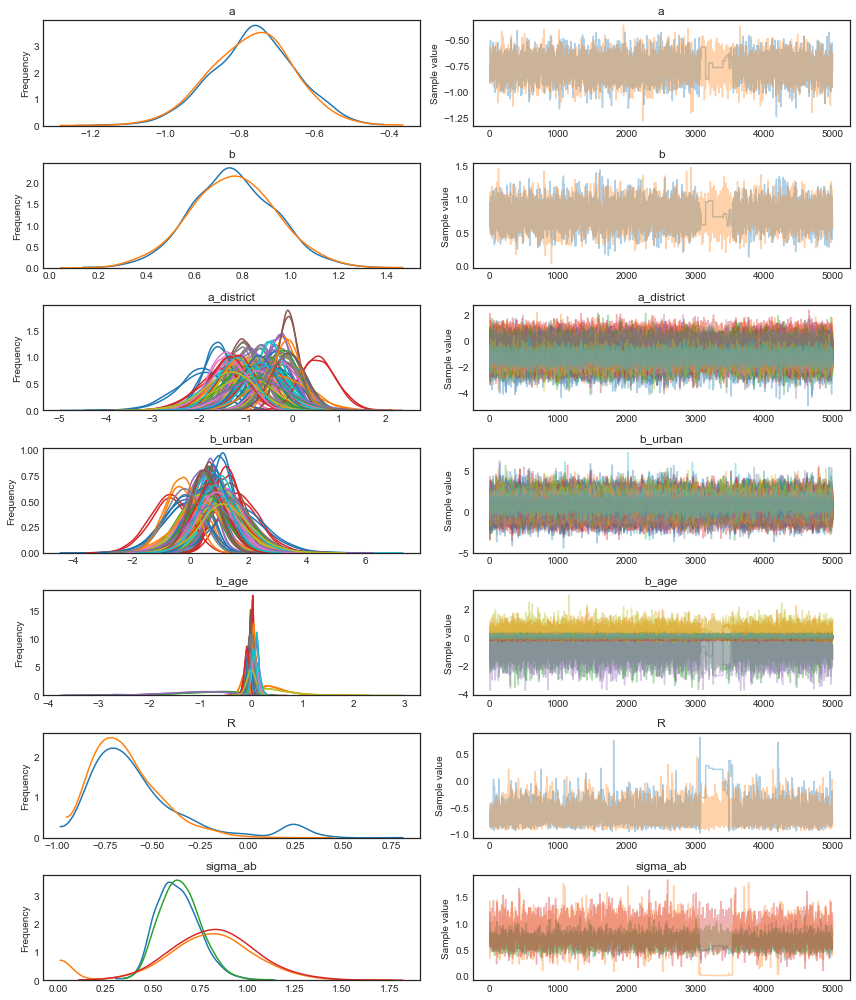

In [82]:
pm.traceplot(tr_urban_age, varnames=['a', 'b', 'a_district', 'b_urban', 'b_age', 'R', 'sigma_ab'])
plt.tight_layout()

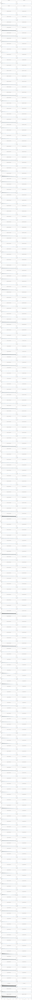

In [83]:
pm.autocorrplot(tr_urban_age, varnames=['a', 'b', 'a_district', 'b_urban', 'b_age', 'R', 'sigma_ab'])
plt.tight_layout()

In [84]:
pm.summary(tr_urban_age)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
a,-0.764669,0.111289,0.001758,-0.990258,-0.555219,3467.074001,1.000685
b,0.762512,0.177309,0.002569,0.422617,1.123077,4310.358065,0.999900
b_age__0,-0.010887,0.026811,0.000555,-0.064322,0.038830,1440.372186,1.000390
b_age__1,0.052754,0.064247,0.000858,-0.067919,0.183714,4500.240513,1.000194
b_age__2,-0.872890,0.627345,0.018074,-2.156352,0.150657,1396.738129,0.999992
b_age__3,0.002810,0.054236,0.000593,-0.107114,0.103844,7850.786651,0.999926
b_age__4,-0.021190,0.038982,0.001189,-0.090847,0.057914,1037.411822,1.000432
b_age__5,-0.026327,0.034366,0.000477,-0.095121,0.039593,5280.199697,1.000053
b_age__6,-0.011373,0.072999,0.001088,-0.149886,0.132485,3901.952715,1.000369
b_age__7,0.040633,0.037152,0.000536,-0.034441,0.110526,5864.603927,1.000157


In [85]:
pm.waic(tr_urban_age, model_urban_age)

WAIC_r(WAIC=2525.653446683137, WAIC_se=32.76492733213419, p_WAIC=111.88159464759934, var_warn=1)

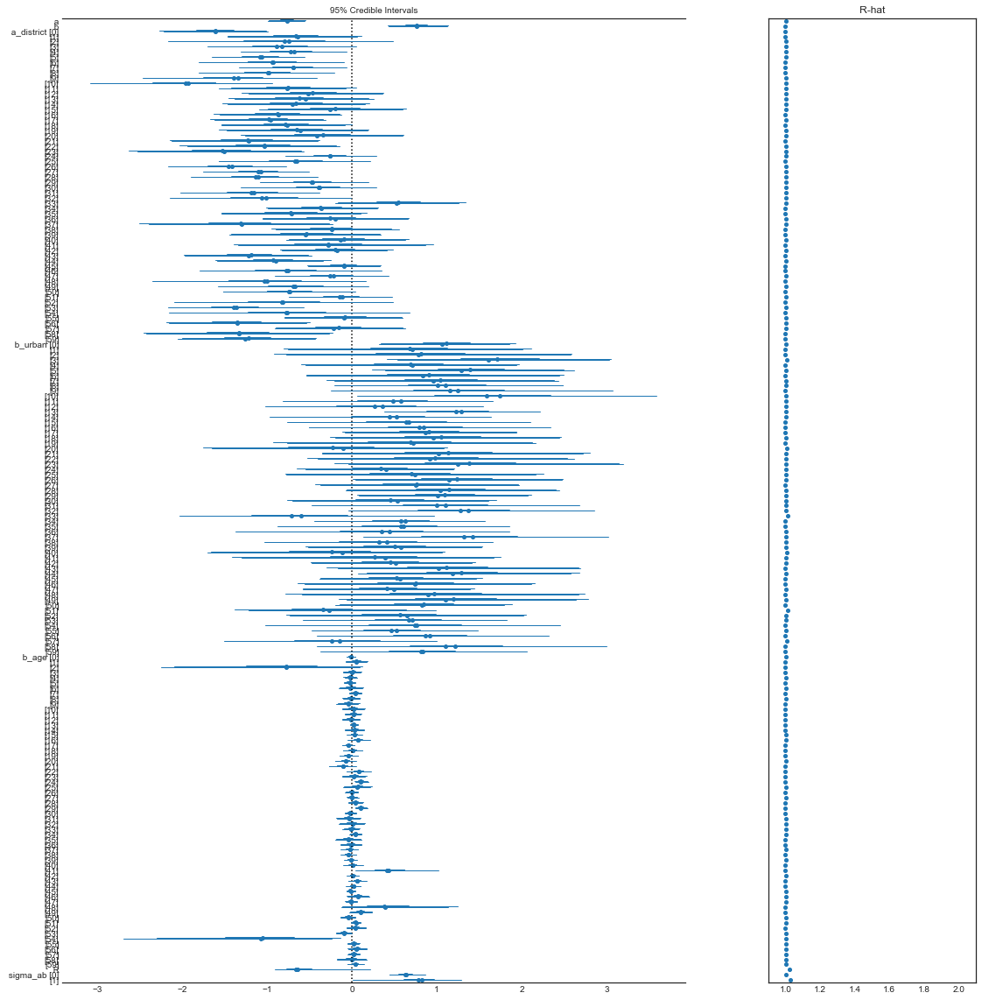

In [86]:
fig, ax = plt.subplots(figsize=(20, 18))
pm.forestplot(tr_urban_age, varnames=['a', 'b', 'a_district', 'b_urban', 'b_age', 'R', 'sigma_ab'])
plt.tight_layout()

In [87]:
with Model() as model_urban_child:
    a = pm.Normal('a', 0, 10)
    b = pm.Normal('b', 0, 1)
    b_child = pm.Normal('b_child', 0, 1, shape=60)
    
    # prior on correlations
    packed_L = pm.LKJCholeskyCov('packed_L', eta=2, n=2, sd_dist=pm.HalfCauchy.dist(beta=2))
    
    # compute the covariance matrix
    L = pm.expand_packed_triangular(2, packed_L, lower=True)
    cov = tt.dot(L, L.T)
    
    # Extract the standard deviations and R
    sigma_ab = pm.Deterministic('sigma_ab', tt.sqrt(tt.diag(cov)))
    corr = tt.diag(sigma_ab**-1).dot(cov.dot(tt.diag(sigma_ab**-1)))
    R = pm.Deterministic('R', corr[np.triu_indices(2, k=1)])
    
    # district specific intercepts & slopes
    mu_raw = pm.Normal('mu_raw', mu=0, sd=1, shape=(60, 2))
    mu = pm.Deterministic('mu', tt.stack([a, b]) + tt.dot(L, mu_raw.T).T)
    a_district = pm.Deterministic('a_district', mu[:, 0])
    b_urban = pm.Deterministic('b_urban', mu[:, 1])
    
    # p = invlogit(a_district + b_district * urban + c_district * age.centered)
    logit_p = mu[df_bang['district_id'].values, 0] + \
              mu[df_bang['district_id'].values, 1] * df_bang['urban'].values + \
              b_child[df_bang['district_id'].values] * df_bang['many.children'].values

    p = pm.Deterministic('p', pm.math.invlogit(logit_p))
    Y = pm.Bernoulli('Y', p=p, observed=df_bang['use.contraception'].values)

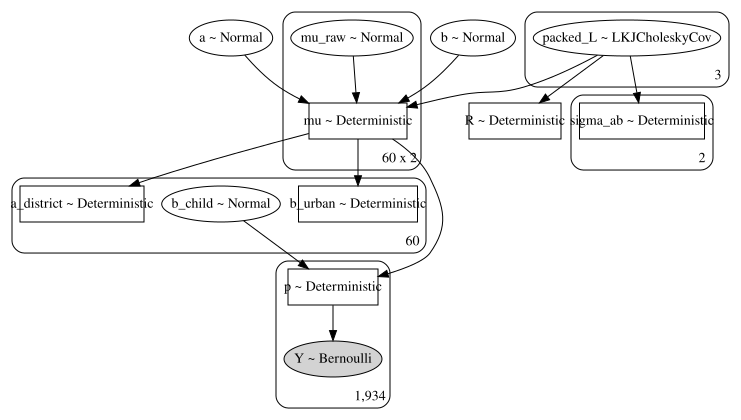

In [88]:
pm.model_to_graphviz(model_urban_child)

In [89]:
with model_urban_child:
    tr_urban_child = pm.sample(5000, tune=500, target_accept=0.9, cores=-1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [mu_raw, packed_L, b_child, b, a]
100%|██████████| 5500/5500 [01:51<00:00, 49.52it/s]
The number of effective samples is smaller than 25% for some parameters.


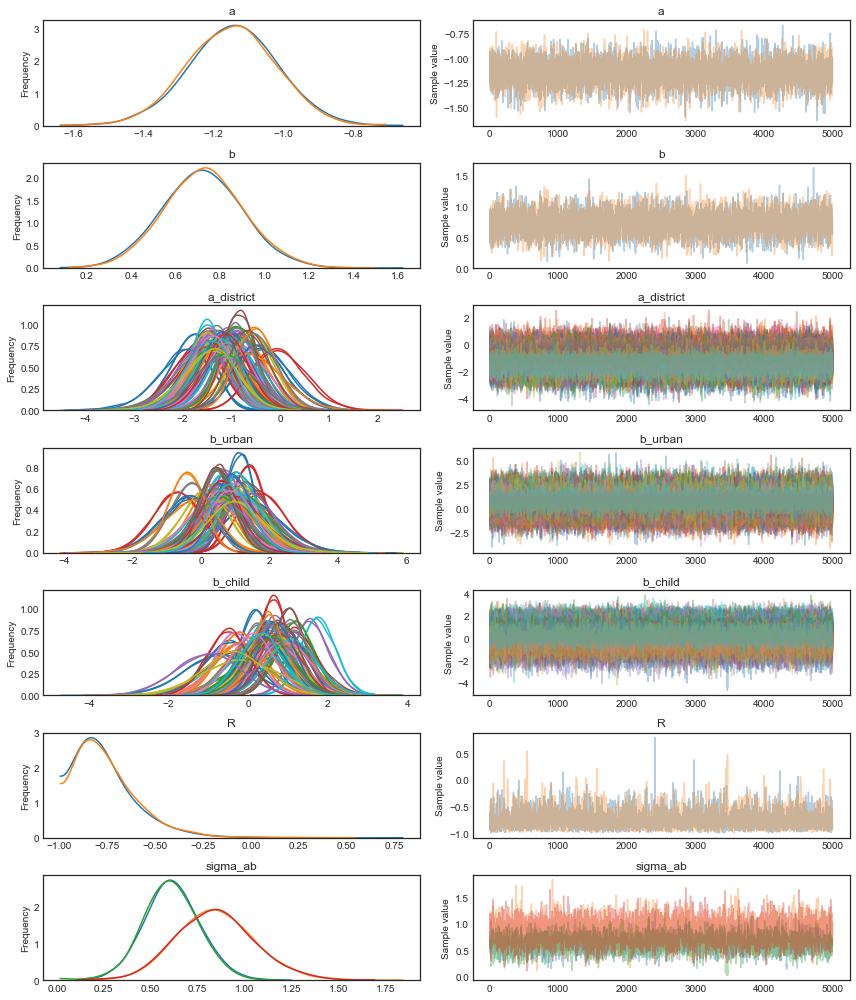

In [90]:
pm.traceplot(tr_urban_child, varnames=['a', 'b', 'a_district', 'b_urban', 'b_child', 'R', 'sigma_ab'])
plt.tight_layout()

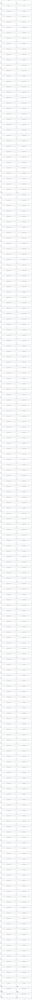

In [91]:
pm.autocorrplot(tr_urban_child, varnames=['a', 'b', 'a_district', 'b_urban', 'b_child', 'R', 'sigma_ab'])
plt.tight_layout()

In [92]:
pm.summary(tr_urban_child)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
a,-1.145901,0.125644,0.002015,-1.389051,-0.895612,4101.291279,1.000524
b,0.725352,0.178911,0.002641,0.364073,1.068557,5379.153311,1.000526
b_child__0,0.217471,0.392309,0.004564,-0.534255,1.008203,6426.694433,0.999992
b_child__1,0.742504,0.600598,0.006673,-0.448936,1.904544,9141.069553,1.000246
b_child__2,0.443264,0.904284,0.008341,-1.296198,2.229852,12516.005684,0.999903
b_child__3,1.202003,0.523136,0.005891,0.154158,2.208491,8156.511771,0.999909
b_child__4,0.560776,0.508181,0.004842,-0.469199,1.522647,9269.099521,0.999958
b_child__5,0.561610,0.452974,0.004947,-0.279859,1.493419,9549.830830,0.999900
b_child__6,-0.197804,0.648572,0.006294,-1.460761,1.062264,13210.124194,0.999908
b_child__7,1.168800,0.526163,0.005583,0.107163,2.178138,8553.365635,0.999921


In [93]:
pm.waic(tr_urban_child, model_urban_child)

WAIC_r(WAIC=2408.595478191673, WAIC_se=32.422569067251885, p_WAIC=78.45586587839789, var_warn=1)

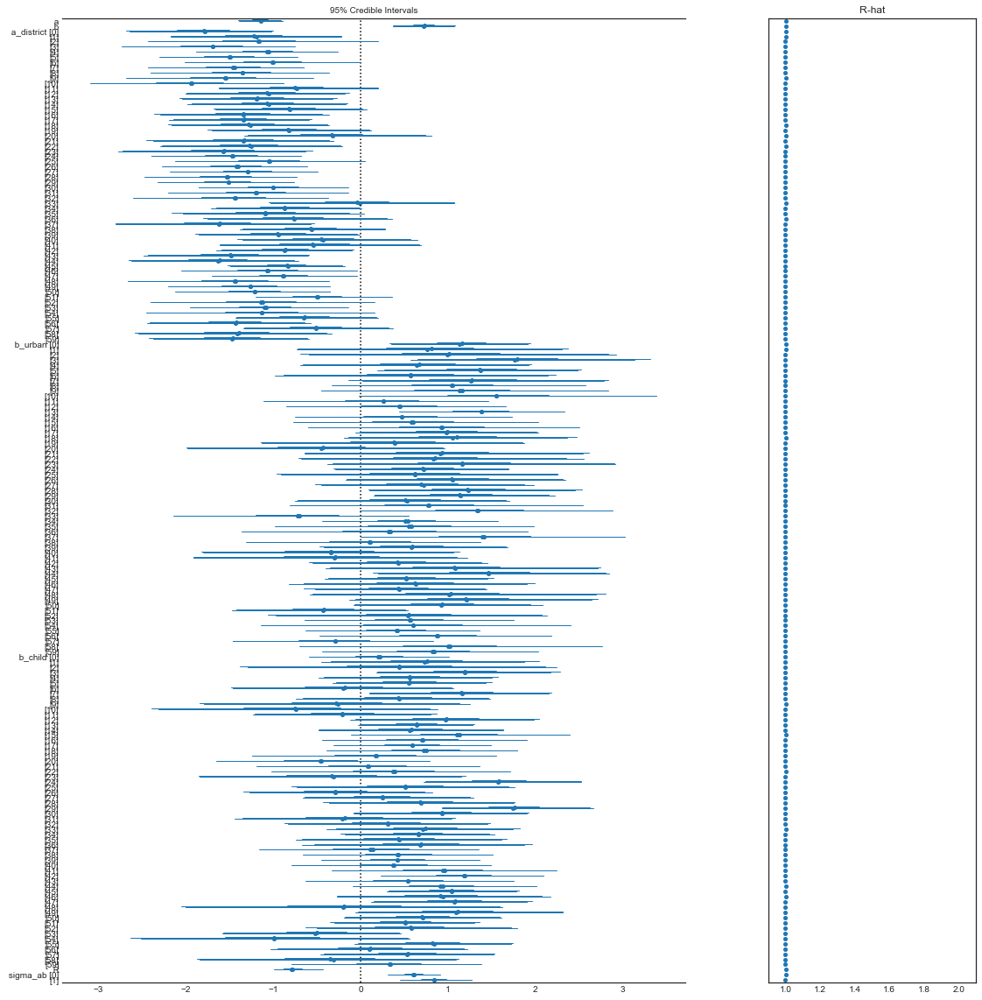

In [94]:
fig, ax = plt.subplots(figsize=(20, 18))
pm.forestplot(tr_urban_child, varnames=['a', 'b', 'a_district', 'b_urban', 'b_child', 'R', 'sigma_ab'])
plt.tight_layout()

In [95]:
with Model() as model_all:
    a = pm.Normal('a', 0, 10)
    b = pm.Normal('b', 0, 1)
    b_age = pm.Normal('b_age', 0, 1, shape=60)
    b_child = pm.Normal('b_child', 0, 1, shape=60)
    
    # prior on correlations
    packed_L = pm.LKJCholeskyCov('packed_L', eta=2, n=2, sd_dist=pm.HalfCauchy.dist(beta=2))
    
    # compute the covariance matrix
    L = pm.expand_packed_triangular(2, packed_L, lower=True)
    cov = tt.dot(L, L.T)
    
    # Extract the standard deviations and R
    sigma_ab = pm.Deterministic('sigma_ab', tt.sqrt(tt.diag(cov)))
    corr = tt.diag(sigma_ab**-1).dot(cov.dot(tt.diag(sigma_ab**-1)))
    R = pm.Deterministic('R', corr[np.triu_indices(2, k=1)])
    
    # district specific intercepts & slopes
    mu_raw = pm.Normal('mu_raw', mu=0, sd=1, shape=(60, 2))
    mu = pm.Deterministic('mu', tt.stack([a, b]) + tt.dot(L, mu_raw.T).T)
    a_district = pm.Deterministic('a_district', mu[:, 0])
    b_urban = pm.Deterministic('b_urban', mu[:, 1])
    
    # p = invlogit(a_district + b_district * urban + c_district * age.centered)
    logit_p = mu[df_bang['district_id'].values, 0] + \
              mu[df_bang['district_id'].values, 1] * df_bang['urban'].values + \
              b_age[df_bang['district_id'].values] * df_bang['age.centered'].values + \
              b_child[df_bang['district_id'].values] * df_bang['many.children'].values

    p = pm.Deterministic('p', pm.math.invlogit(logit_p))
    Y = pm.Bernoulli('Y', p=p, observed=df_bang['use.contraception'].values)

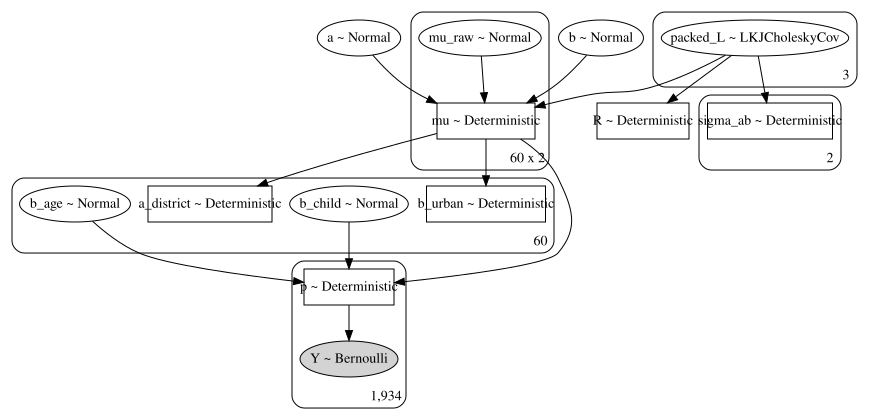

In [96]:
pm.model_to_graphviz(model_all)

In [98]:
with model_all:
    tr_all = pm.sample(5000, tune=500, target_accept=0.9, cores=-1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [mu_raw, packed_L, b_child, b_age, b, a]
100%|██████████| 5500/5500 [02:08<00:00, 42.70it/s]
The number of effective samples is smaller than 25% for some parameters.


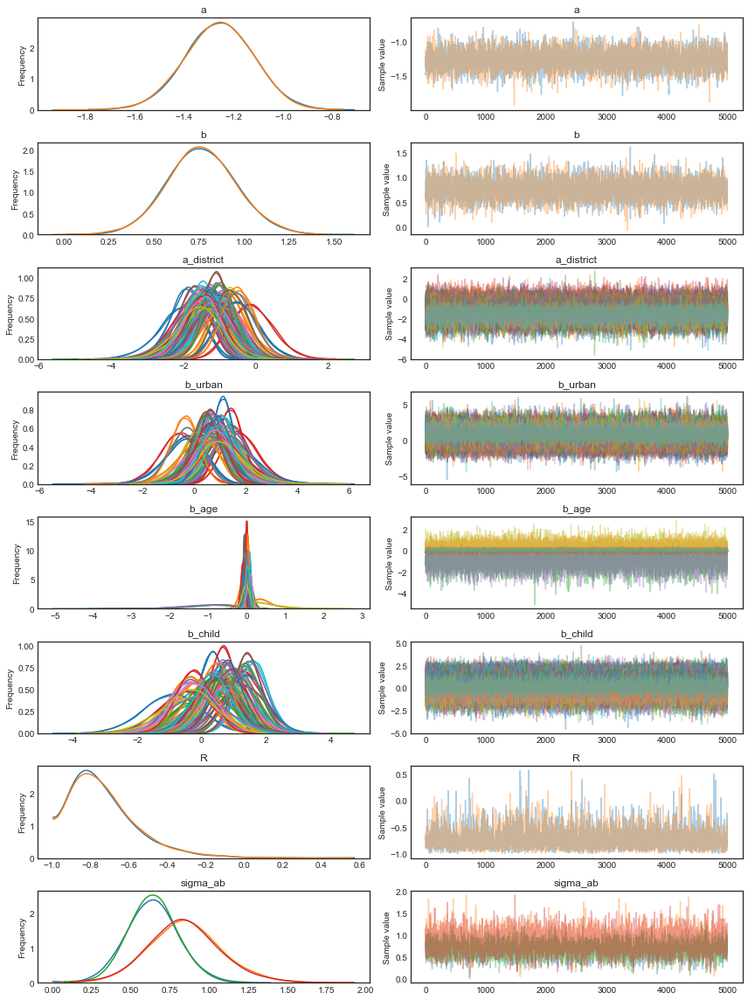

In [99]:
pm.traceplot(tr_all, varnames=['a', 'b', 'a_district', 'b_urban', 'b_age', 'b_child', 'R', 'sigma_ab'])
plt.tight_layout()

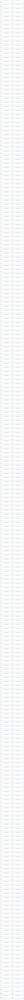

In [100]:
pm.autocorrplot(tr_all, varnames=['a', 'b', 'a_district', 'b_urban', 'b_age', 'b_child', 'R', 'sigma_ab'])
plt.tight_layout()

In [101]:
pm.summary(tr_all)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
a,-1.257649,0.137075,0.002199,-1.525365,-0.993277,4098.606439,0.999988
b,0.766685,0.188681,0.002475,0.394921,1.136693,4819.348312,0.999903
b_age__0,-0.017207,0.029023,0.000265,-0.073685,0.039604,10942.077198,0.999958
b_age__1,0.036005,0.067628,0.000766,-0.097462,0.169750,9577.579515,0.999909
b_age__2,-0.950885,0.629874,0.006821,-2.187610,0.150939,7480.166433,0.999901
b_age__3,-0.020516,0.056783,0.000343,-0.128493,0.093505,15877.108390,0.999953
b_age__4,-0.049912,0.040883,0.000445,-0.132362,0.028540,8235.063872,0.999920
b_age__5,-0.048573,0.038077,0.000384,-0.123127,0.025649,10851.224394,0.999970
b_age__6,-0.021795,0.079648,0.000806,-0.171238,0.142228,10119.886297,1.000189
b_age__7,0.022526,0.039502,0.000345,-0.052418,0.101899,12996.629720,1.000160


In [102]:
pm.waic(tr_all, model_all)

WAIC_r(WAIC=2465.357106116291, WAIC_se=35.78379536730031, p_WAIC=132.76239247400807, var_warn=1)

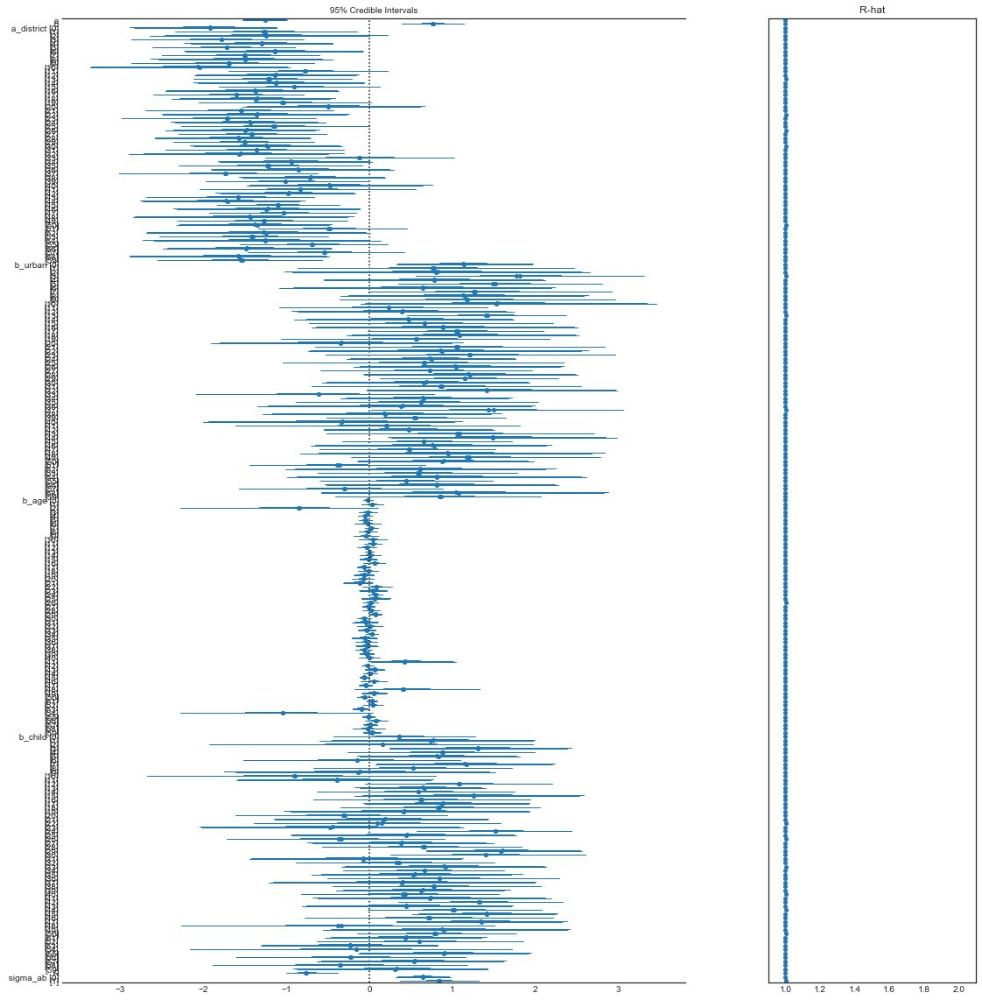

In [103]:
fig, ax = plt.subplots(figsize=(20, 18))
pm.forestplot(tr_all, varnames=['a', 'b', 'a_district', 'b_urban', 'b_age', 'b_child', 'R', 'sigma_ab'])
plt.tight_layout()

In [117]:
logit_rural_few = tr_urban_child['a_district']
logit_rural_many = tr_urban_child['a_district'] + tr_urban_child['b_child']
logit_urban_few = tr_urban_child['a_district'] + tr_urban_child['b_urban']
logit_urban_many = tr_urban_child['a_district'] + tr_urban_child['b_urban'] + tr_urban_child['b_child'] 

# predictions - mean posteriors
post_rural_few = sigmoid(logit_rural_few).mean(axis=0)
post_rural_many = sigmoid(logit_rural_many).mean(axis=0)
post_urban_few = sigmoid(logit_urban_few).mean(axis=0)
post_urban_many = sigmoid(logit_urban_many).mean(axis=0)

# predictions - mean pp
pp_rural_few = bernoulli.rvs(p=sigmoid(logit_rural_few)).mean(axis=0)
pp_rural_many = bernoulli.rvs(p=sigmoid(logit_rural_many)).mean(axis=0)
pp_urban_few = bernoulli.rvs(p=sigmoid(logit_urban_few)).mean(axis=0)
pp_urban_many = bernoulli.rvs(p=sigmoid(logit_urban_many)).mean(axis=0)

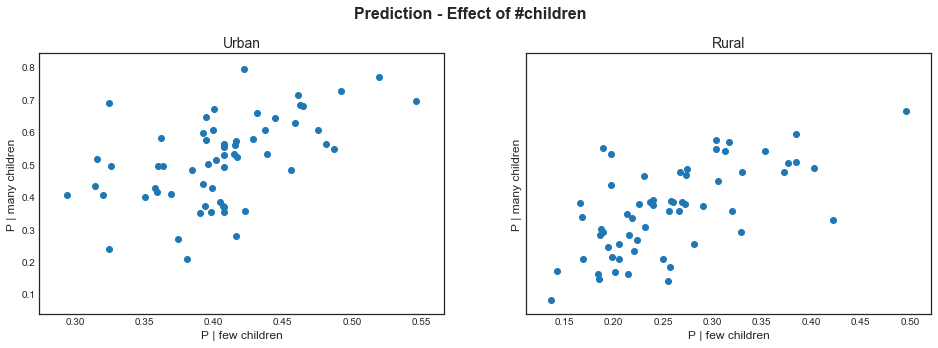

In [122]:
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(16, 5))
plt.suptitle('Prediction - Effect of #children', fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.85)

ax[0].scatter(x=pp_urban_few, y=pp_urban_many)
ax[0].set_xlabel('P | few children', fontsize=12)
ax[0].set_ylabel('P | many children', fontsize=12)
ax[0].set_title('Urban', fontsize=14)

ax[1].scatter(x=pp_rural_few, y=pp_rural_many)
ax[1].set_xlabel('P | few children', fontsize=12)
ax[1].set_ylabel('P | many children', fontsize=12)
ax[1].set_title('Rural', fontsize=14)
plt.show()

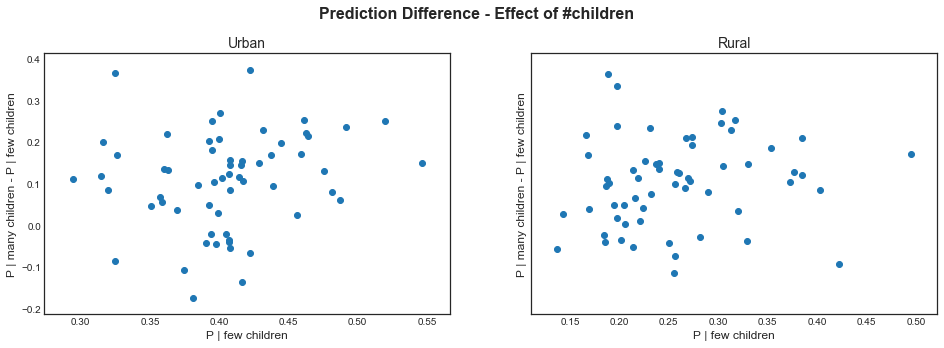

In [123]:
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(16, 5))
plt.suptitle('Prediction Difference - Effect of #children', fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.85)

ax[0].scatter(x=pp_urban_few, y=pp_urban_many - pp_urban_few)
ax[0].set_xlabel('P | few children', fontsize=12)
ax[0].set_ylabel('P | many children - P | few children', fontsize=12)
ax[0].set_title('Urban', fontsize=14)

ax[1].scatter(x=pp_rural_few, y=pp_rural_many - pp_rural_few)
ax[1].set_xlabel('P | few children', fontsize=12)
ax[1].set_ylabel('P | many children - P | few children', fontsize=12)
ax[1].set_title('Rural', fontsize=14)
plt.show()

<font color='blue'>
**B5**
<br>
Q1 B5 Based on the forestplots, `age.centered` of most districts are not siginificant because their 95% interval contain 0. Extreme slope values happen in districts with fewer samples.

However, `many.children` (defined as having at least 2 kids) appears to be significant. We can observe a similar over the urban/rural divide where **women with `many.children` have higher overall contraceptive usage** compared to women with fewer than 2 kids. While this may seem counter-intuitive at the first glance, one possible explanation is that families with more children may be more aware of contraceptive use since they are more likely to wish to prevent having more children.
For both urban and rural areas where women with fewer children have higher average usage, the difference in contraceptive usage between many and few children is smaller.

**B6** Use WAIC to compare your models. What are your conclusions?

In [119]:
# model comparison
model_a_fix.name = 'intercept.fix'
model_a.name = 'intercept.vary'
model_urban.name = 'intercept + urban'
model_urban_age.name = 'intercept + urban + age'
model_urban_child.name = 'intercept + urban + child'
model_all.name = 'intercept + urban + age + child'

df_compare = pm.compare({
    model_a_fix: tr_a_fix, 
    model_a: tr_a, 
    model_urban: tr_urban, 
    model_urban_age: tr_urban_age, 
    model_urban_child: tr_urban_child,
    model_all: tr_all
})
df_compare

,WAIC,pWAIC,dWAIC,weight,SE,dSE,var_warn
intercept + urban + child,2408.6,78.46,0,1,32.42,0,1
intercept + urban + age + child,2465.36,132.76,56.76,0,35.78,15.39,1
intercept + urban,2467.74,52.53,59.15,0,28.18,14.61,0
intercept.vary,2514.04,35.6,105.44,0,25.06,19.54,0
intercept + urban + age,2525.65,111.88,117.06,0,32.76,19.93,1
intercept.fix,2534.11,62.99,125.51,0,33.01,21.12,1


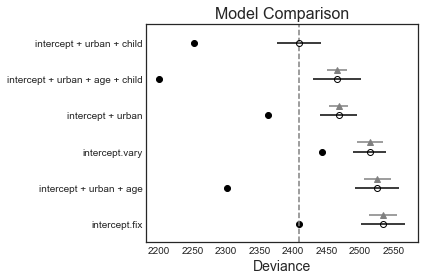

In [120]:
pm.compareplot(df_compare)
plt.title('Model Comparison', fontsize=16)
plt.tight_layout()

<font color='blue'>
**B6**
<br>
Based on WAIC scores and the model comparison plot, the `intercept + urban + child` model is the best with statistical significance as it has the lowest WAIC and its SE confidence interval is mostly not overlapping with the SE intervals of other models. This result supports using district specific slopes for `urban` and `many.children` in predicting contraceptive use.

## Q2: Mixture of experts and mixture density networks to solve inverse problems

What if you had to predict a one-to-many function? The data provided below comes from a dataset generated by Chris Bishop (yes that Bishop) to explain the models mentioned in the title above. We have included pdfs from his book which describe these models in some detail. We saw this model earlier in HW where we did an EM like algorithm to obtain a mixture of regressions.

The data is in `one-to-many.csv`

When we plot the data it looks like this. Notice both the uneven sampling (more towards the center), and the "more than one y" for a given x.

![](images/inverse.png)

Normal regression approaches to modeling such a function wont work, as they expect the function to be a proper mathematical function, that is, single valued.

These kind of problems are called **inverse problems**, where more than one input state leads to an output state, and we have to try and model these multiple input states.

A mixture of gaussians (or other distributions) might is a sensible way to do this.

You choose one of the gaussians with some probability. The nean of the gaussian is then given by some regression function, say for example a straight line. We could additionally fix the standard deviation or model it as well. 

Thus, for each component Gaussian, we choose a functional form for the mean and standard deviation. So our model looks something like this:

$$f(x)  = \sum_i \lambda_i g_i (x) $$

Say we fit a model with 3 gaussians to this data. Such a model cannot fit the function above. Notice for example that at $x=0.2$ only one of the gaussians will dominate, different from the situation at $x=0.5$. This means that the probabilities of "belonging" to one or the other gaussians is also changing with $x$.

If we allow the mixing probabilities to depend on $x$, we can model this situation.

$$f(x)  = \sum_i \lambda_i (x) g_i (x) $$

Such a model is called a "mixture of experts" model. The idea is that one "expert" gaussian is responsible in one sector of the feature space, while another expert is responsible in another sector.

You can think of this model as implementing a "standard" gaussian mixture at each "point" x, with the added complexity that all of the means, standard deviations, and mixture probabilities change from one x to another.

See https://www.cs.toronto.edu/~hinton/absps/hme.pdf and http://www.ee.hacettepe.edu.tr/~eyuksel/Publications/2012_TwentyYearsofMixtureofExperts.pdf for more details. I found the latter clearer and easier to understand.

For this entire question you might find diagram code from [here](https://github.com/hardmaru/pytorch_notebooks/blob/master/mixture_density_networks.ipynb) useful. Take with attribution.

We will assume we have **3 gaussians**.

## Part A: Variational Mixture of experts

We'll construct a gaussian mixture model of 3 "expert" linear regressions. The idea is to create a fit which looks like this:

![](images/mixreg.png)

Here the three regression lines work in different regions of $f$. We want a pricipled way to sample from this model and to be able to produce posteriors and posterior-predictives.

There are 3 parts to this model. First the means of the gaussians in the mixture are modeled with linear regression as shown in the picture above. We will also model $log(\sigma)$ for each gaussian in the mixture as a linear regression as well ($\sigma$ needs to be positive).

We now need to model the mixture probabilities, i.e., the probabilities required to choose one or the other gaussian. These mixing probabilities, the $\lambda$s will be modeled as a softmax regression (ie do a linear regression and softmax it to get 3 probabilities).

,target,x
0,0.000000,0.018727
1,0.001001,0.050424
2,0.002002,0.042375
3,0.003003,0.038596
4,0.004004,0.019352


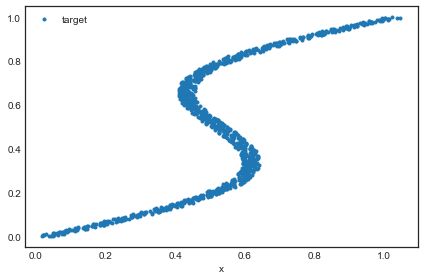

In [72]:
df_12many = pd.read_csv('one-to-many.csv')
display(df_12many.head())

df_12many.plot(x='x', y='target', marker='.', linestyle='')
plt.tight_layout()

**A1** Write a pymc3 model for this problem. For all biases and weights in your regressions, assume N(0,5) priors. Add noise 0.01 to each of the three $\sigma$s to make sure you dont have a collapsed 0 width gaussian, ie we want some data in every cluster. (Thus to get the final $\sigma$, you will exponentiate your regression for $log(\sigma)$ and add 0.01.)

In [73]:
X_shared = shared(df_12many[['x']].values)

with Model() as v_mixture:
    # means
    a_mu = pm.Normal('a_mu', 0, 5, shape=(1, 3))
    b_mu = pm.Normal('b_mu', 0, 5, shape=(1, 3))
    mu = pm.Deterministic('mu', a_mu + pm.math.dot(X_shared, b_mu))
    
    # sigmas
    a_sigma = pm.Normal('a_sigma', 0, 5, shape=(1, 3))
    b_sigma = pm.Normal('b_sigma', 0, 5, shape=(1, 3))
    sigma = pm.Deterministic('sigma', pm.math.exp(a_sigma + pm.math.dot(X_shared, b_sigma)) + 0.01)
    
    # weights
    a_lam = pm.Normal('a_lam', 0, 5, shape=(1, 3))
    b_lam = pm.Normal('b_lam', 0, 5, shape=(1, 3))
    lam = pm.Deterministic('lam', tt.nnet.softmax(a_lam + pm.math.dot(X_shared, b_lam)))
    Y = pm.NormalMixture('Y', w=lam, mu=mu, sd=sigma, observed=df_12many['target'].values)

**A2** Fit this model variationally for about 50,000 iterations using the adam optimizer. (`obj_optimizer=pm.adam()`) Plot the ELBO to make sure you have converged. Print summaries and traceplots for the means, $\sigma$s and probabilities.

In [74]:
v_mix_fit = pm.fit(model=v_mixture, n=50000, obj_optimizer=pm.adam())

Average Loss = -1,602.6: 100%|██████████| 50000/50000 [01:47<00:00, 465.33it/s]
Finished [100%]: Average Loss = -1,602.6


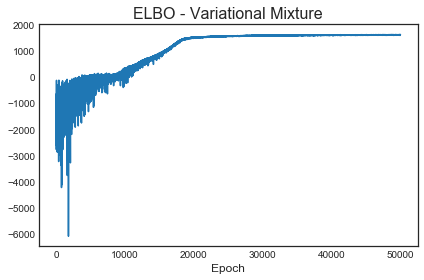

In [75]:
plt.plot(-v_mix_fit.hist)
plt.title('ELBO - Variational Mixture', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.tight_layout()

In [76]:
tr_v_mix = v_mix_fit.sample(10000)

In [77]:
pm.summary(tr_v_mix, varnames=['a_mu', 'b_mu', 'a_sigma', 'b_sigma', 'a_lam', 'b_lam'])

,mean,sd,mc_error,hpd_2.5,hpd_97.5
a_mu__0_0,0.574552,0.000745,0.000007,0.573082,0.575995
a_mu__0_1,-0.020087,0.000737,0.000007,-0.021518,-0.018642
a_mu__0_2,1.330871,0.001985,0.000019,1.327066,1.334833
b_mu__0_0,0.424897,0.000978,0.000010,0.422875,0.426712
b_mu__0_1,0.425475,0.002404,0.000023,0.420621,0.430119
b_mu__0_2,-1.591970,0.003837,0.000035,-1.599649,-1.584732
a_sigma__0_0,1.873294,0.105225,0.001038,1.666090,2.077794
a_sigma__0_1,-10.166488,0.138561,0.001323,-10.455652,-9.908365
a_sigma__0_2,-4.322579,0.058665,0.000582,-4.437246,-4.208434
b_sigma__0_0,-12.322115,0.215798,0.002193,-12.734389,-11.889433


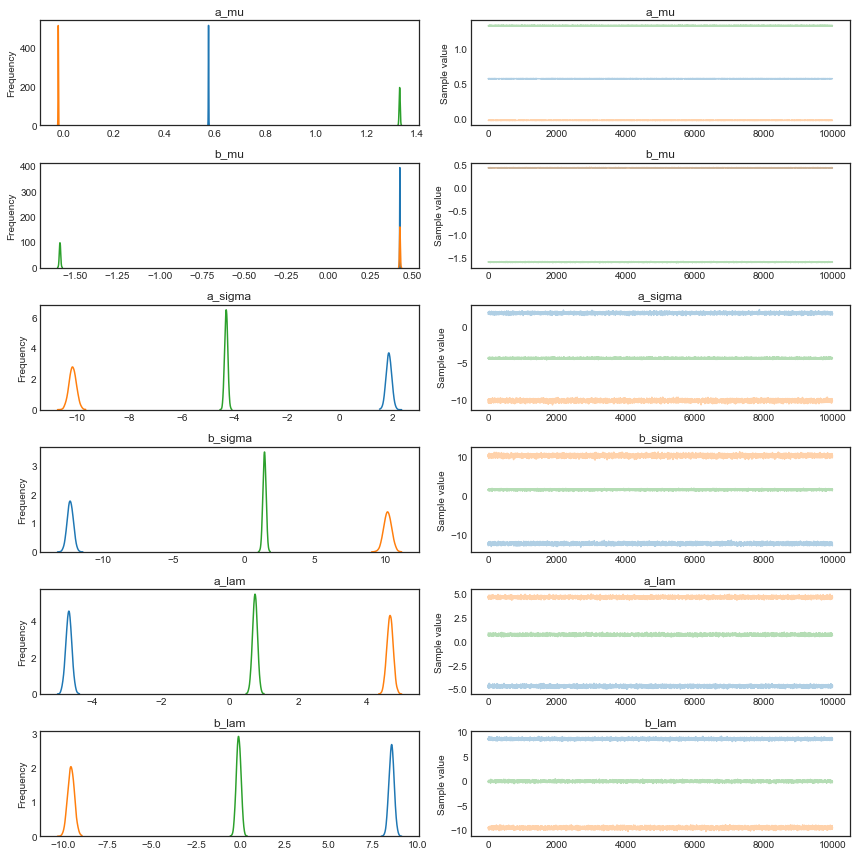

In [78]:
pm.traceplot(tr_v_mix, varnames=['a_mu', 'b_mu', 'a_sigma', 'b_sigma', 'a_lam', 'b_lam'])
plt.tight_layout()

<font color='blue'>
**A2**
<br>
As shown from the ELBO plot, the model converged after around 30,000 iterations. The convergence is supported by the summary dataframe and the traceplots as well.

**A3** Plot the mean posteriors with standard deviations against x. Also produce a diagram like the one above to show the mean"s with standard deviations showing their uncertainty overlaid on the data.

In [79]:
# extract posteriors
mu_post = tr_v_mix['mu']
sigma_post = tr_v_mix['sigma']
lam_post = tr_v_mix['lam']

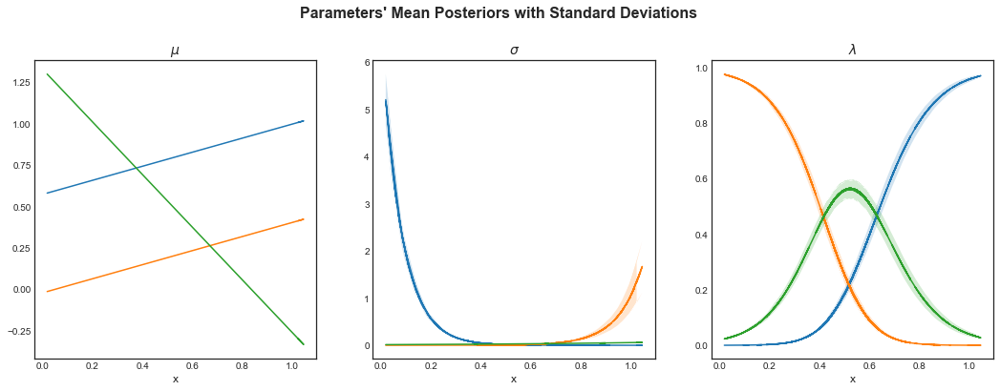

In [87]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Parameters\' Mean Posteriors with Standard Deviations', fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.85)

for i in range(3):
    m_mu = mu_post.mean(axis=0)[:, i]
    s_mu = mu_post.std(axis=0)[:, i]
    ax[0].plot(df_12many['x'], m_mu)
    ax[0].fill_between(df_12many['x'], m_mu - s_mu, m_mu + s_mu, alpha=0.2)
    
    m_sigma = sigma_post.mean(axis=0)[:, i]
    s_sigma = sigma_post.std(axis=0)[:, i]
    ax[1].plot(df_12many['x'], m_sigma)
    ax[1].fill_between(df_12many['x'], m_sigma - s_sigma, m_sigma + s_sigma, alpha=0.2)
    
    m_lam = lam_post.mean(axis=0)[:, i]
    s_lam = lam_post.std(axis=0)[:, i]
    ax[2].plot(df_12many['x'], m_lam)
    ax[2].fill_between(df_12many['x'], m_lam - s_lam, m_lam + s_lam, alpha=0.2)

ax[0].set_title(r'$\mu$', fontsize=14)
ax[1].set_title(r'$\sigma$', fontsize=14)
ax[2].set_title(r'$\lambda$', fontsize=14)    
ax[0].set_xlabel('x', fontsize=12)
ax[1].set_xlabel('x', fontsize=12)
ax[2].set_xlabel('x', fontsize=12)
plt.show()

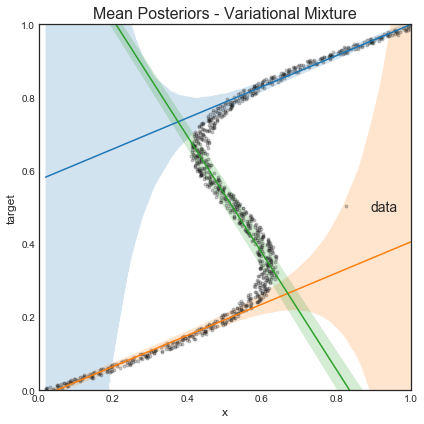

In [89]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
df_12many.plot(x='x', y='target', marker='.', linestyle='', c='k', label='data', alpha=0.2, ax=ax)

for i in range(3):
    m = mu_post.mean(axis=0)[:, i]
    s = sigma_post.mean(axis=0)[:, i]
    ax.plot(df_12many['x'], m)
    ax.fill_between(df_12many['x'], m - s, m + s, alpha=0.2)
    
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('target', fontsize=12)
ax.legend(fontsize=14)
ax.set_title('Mean Posteriors - Variational Mixture', fontsize=16)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.tight_layout()

**A4** Plot the posterior predictive (mean and variance) as a function of x) for this model (using `sample_ppc` for example). Why does the posterior predictive look nothing like the data?

In [90]:
# draw posterior predictives
X_shared.set_value(np.linspace(0, 1, 100).reshape(-1, 1))
sample_pp = pm.sample_ppc(tr_v_mix, samples=1000, model=v_mixture)

100%|██████████| 1000/1000 [00:15<00:00, 66.20it/s]


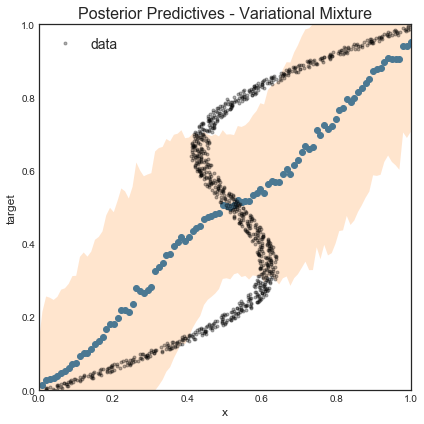

In [95]:
fig, ax = plt.subplots(figsize = (6, 6))
df_12many.plot(x='x', y='target', marker='.', linestyle='', c='k', label='data', alpha=0.3, ax=ax)

m = sample_pp['Y'].mean(axis=0)
s = sample_pp['Y'].std(axis=0)
ax.scatter(x=np.linspace(0, 1, 100), y=m)
ax.fill_between(np.linspace(0, 1, 100), m - s, m + s, alpha=0.2)

ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('target', fontsize=12)
ax.legend(fontsize=14)
ax.set_title('Posterior Predictives - Variational Mixture', fontsize=16)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.tight_layout()

<font color='blue'>
**A4**
<br>
The posterior predictives look nothing like the data because at each x, all pp samples coming from 3 different Gaussians are aggregated to 1 meaningless mean value. A correct way of aggregating pp samples is to average samples coming from the same Gaussian.
</font>

**A5** Make a "correct" posterior predictive diagram by taking into account which "cluster" or "regression line" the data is coming from. To do this you will need to sample using the softmax probabilities. A nice way to do this is "Gumbel softmax sampling". See http://timvieira.github.io/blog/post/2014/07/31/gumbel-max-trick/ for details. Color-code the predictive samples with the gaussian they came from. Superimpose the predictive on the original data. You may want to contrast a prediction from a point estimate at the mean values of the $\mu$ and $\sigma$ traces at a given x (given the picked gaussian) to the "full" posterior predictive obtained from sampling from the entire trace of $\mu$ and $\sigma$ and $\lambda$. The former diagram may look something like this:

![](images/mixpred.png)

<font color='blue'>
**A5**
<br>
Refer to A4 for a similar explanation of this observation. A correct way of generating posterior predictive for mixture model is to generate samples from a specific Gaussian given its predicted cluster.

<font color='blue'>
    We referenced the implementation of gumbel_sample() and the usage of the posterior $\lambda$'s from this [notebook](https://github.com/hardmaru/pytorch_notebooks/blob/master/mixture_density_networks.ipynb).
</font>

In [96]:
def gumbel_sample(lam):
    z = np.random.gumbel(loc=0, scale=1, size=lam.shape)
    return (np.log(lam) + z).argmax(axis=1)

In [97]:
k_post = gumbel_sample(lam_post.mean(axis=0))
indices = (np.arange(len(df_12many)), k_post)
rvn = np.random.randn(len(df_12many))

df_pp_vm = pd.DataFrame(data={
    'group': k_post,
    'x': df_12many['x'],
    'target': mu_post.mean(axis=0)[indices] + sigma_post.mean(axis=0)[indices] * rvn
})
df_pp_vm.head()

,group,target,x
0,1,-0.009066,0.018727
1,1,0.016424,0.050424
2,1,-0.002881,0.042375
3,1,0.008248,0.038596
4,1,-0.015048,0.019352


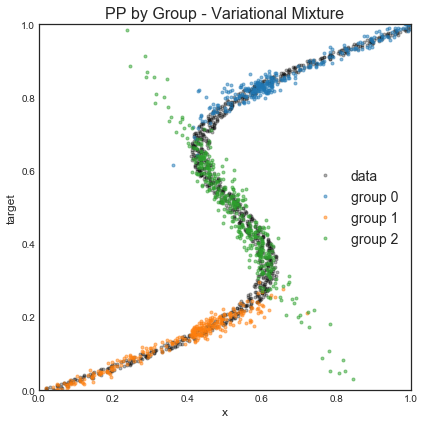

In [98]:
fig, ax = plt.subplots(figsize = (6, 6))
df_12many.plot(x='x', y='target', marker='.', linestyle='', c='k', label='data', alpha=0.3, ax=ax)
for i in range(3):
    df_group = df_pp_vm.set_index('group').loc[i, ['x', 'target']]
    df_group.plot(x='x', y='target', marker='.',linestyle='', alpha=0.5, label='group {}'.format(i), ax=ax)

ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('target', fontsize=12)
ax.legend(fontsize=14)
ax.set_title('PP by Group - Variational Mixture', fontsize=16)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.tight_layout()

## Part B. Mixture Density Network

A mixture density network (see the enclosed Chapter 5 excerpt from Bishop or https://publications.aston.ac.uk/373/1/NCRG_94_004.pdf) is very closely related to the mixture of experts model. The difference is that we fit the regressions using a neural network where hidden layers are shared amongst the mean, sigma, and mixing probability regressions. (We could have fit 3 separate neural networks in Part A but opted to fit linear regressions for simplicity)

(More explanation [here](https://github.com/hardmaru/pytorch_notebooks/blob/master/mixture_density_networks.ipynb). You are welcome to take code from here with attribution.)

You job here is to construct a multi-layer perceptron model with a linear hidden layer with 20 units followed by a `Tanh` activation. After the activation layer, 3 separate linear layers with `n_hidden` inputs and `n_gaussian=3` outputs will complete the network. The probabilities part of the network is then passed through a softmax. The means part is left as is. The sigma part is exponentiated and 0.01 added, as in part A

Thus the structure looks like:

```
input:1 --linear-> n_hidden -> Tanh --linear-->n_gaussians      ...mu
                            --linear-->n_gaussians->softmax     ...lambda
                            --linear-->n_gaussians->exp + 0.01  ...sigma
```

We then need to use a loss function for the last layer of the network. 

Using the mean-squared-error loss is not appropriate as the expected value of samples drawn from the sampling distribution of the network will not reflect the 3-gaussian structure (this is the essence of the difference between A4 and A5 above). Thus we'll use the negative loss likelihood of the gaussian mixture model explicitly.

**B1**: Write the network as a class `MixtureDensityNetwork` which inherits from pytorch `nn.Module`. Implement a constructor which allows at-least the number of hidden layers to be varied. Also implement the `forward` method.

<font color='blue'>
We referenced the torch MDN implementation from this [notebook](https://github.com/hardmaru/pytorch_notebooks/blob/master/mixture_density_networks.ipynb).
</font>

In [99]:
import torch
import torch.nn as nn
from torch.autograd import Variable

class MixtureDensityNetwork(nn.Module):
    def __init__(self, n_hidden, n_gaussians):
        super(MixtureDensityNetwork, self).__init__()
        self.z_h = nn.Sequential(
            nn.Linear(1, n_hidden),
            nn.Tanh()
        )
        self.z_mu = nn.Linear(n_hidden, n_gaussians) # means
        self.z_sigma = nn.Linear(n_hidden, n_gaussians) # sigmas
        self.z_lam = nn.Linear(n_hidden, n_gaussians) # weights
        
    def forward(self, x):
        z_h = self.z_h(x)
        mu = self.z_mu(z_h)
        sigma = torch.exp(self.z_sigma(z_h))
        lam = nn.functional.softmax(self.z_lam(z_h), -1)
        return mu, sigma, lam

    
oneDivSqrtTwoPI = 1.0 / np.sqrt(2.0 * np.pi) # normalization factor for Gaussians
def gaussian_distribution(y, mu, sigma):
    # make |mu| = K copies of y, subtract mu, divide by sigma
    result = (y.expand_as(mu) - mu) * torch.reciprocal(sigma)
    result = -0.5 * (result * result)
    return (torch.exp(result) * torch.reciprocal(sigma)) * oneDivSqrtTwoPI

def mdn_loss_fn(mu, sigma, lam, y):
    result = gaussian_distribution(y, mu, sigma) * lam
    result = torch.sum(result, dim=1)
    result = -torch.log(result)
    return torch.mean(result)

**B2**: Train the network using the Adam or similiar optimizer and gradient descent/SGD. Make sure your loss converges and plot this convergence.

In [100]:
# create the MDN model
mdn_torch = MixtureDensityNetwork(n_hidden=20, n_gaussians=3)
optimizer = torch.optim.Adam(mdn_torch.parameters())

# prepare data
x_variable = Variable(torch.from_numpy(np.float32(df_12many[['x']].values)))
y_variable = Variable(torch.from_numpy(np.float32(df_12many[['target']].values)), requires_grad=False)

# train the MDN model
loss_history = []
def train_mdn():
    for epoch in range(10000):
        mu_variable, sigma_variable, lam_variable = mdn_torch(x_variable)
        loss = mdn_loss_fn(mu_variable, sigma_variable, lam_variable, y_variable)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loss_history.append(loss.data[0])
        
        if epoch % 500 == 0:
            print('epoch = {}, loss = {}'.format(epoch, loss.data[0]), end='\r')

train_mdn()

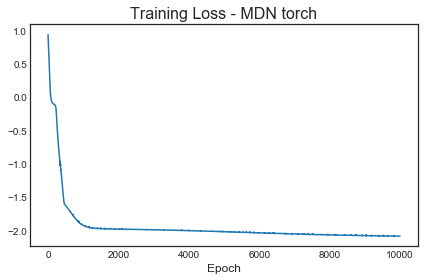

In [101]:
plt.plot(loss_history)
plt.title('Training Loss - MDN torch', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.tight_layout()

<font color='blue'>
**B2**
<br>
Based on the loss history, the model converged after around 2,000 epochs.

**B3**: Plot the MLE parameters against x. Make a plot similar to A3 above where you overlay the "means" of the gaussians against the data.  Plot traces of the mu/sigma/lambda as an aid in debugging.

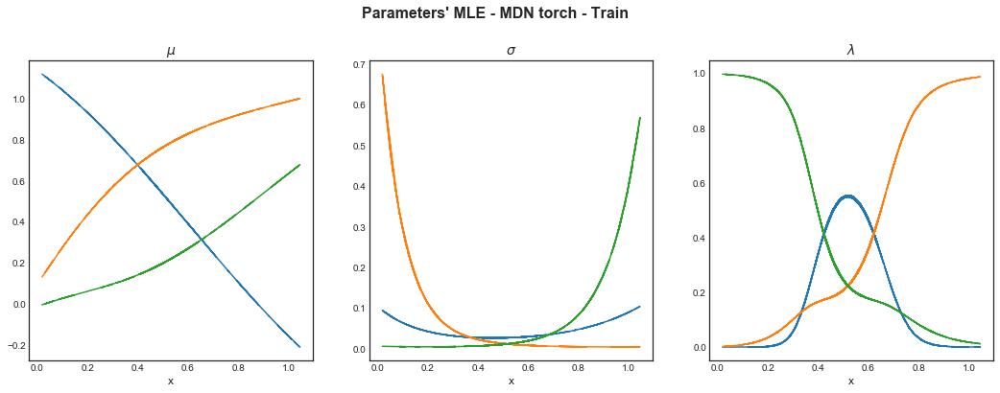

In [102]:
# extract posteriors - train
x_var_train = Variable(torch.from_numpy(np.float32(df_12many['x']).reshape(-1, 1)))
mu_var_train, sigma_var_train, lam_var_train = mdn_torch(x_var_train)

mu_train = mu_var_train.data.numpy()
sigma_train = sigma_var_train.data.numpy()
lam_train = lam_var_train.data.numpy()

# plot MLE against x
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Parameters\' MLE - MDN torch - Train', fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.85)

ax[0].plot(df_12many['x'], mu_train)
ax[1].plot(df_12many['x'], sigma_train)
ax[2].plot(df_12many['x'], lam_train)

ax[0].set_title(r'$\mu$', fontsize=14)
ax[1].set_title(r'$\sigma$', fontsize=14)
ax[2].set_title(r'$\lambda$', fontsize=14)    
ax[0].set_xlabel('x', fontsize=12)
ax[1].set_xlabel('x', fontsize=12)
ax[2].set_xlabel('x', fontsize=12)
plt.show()

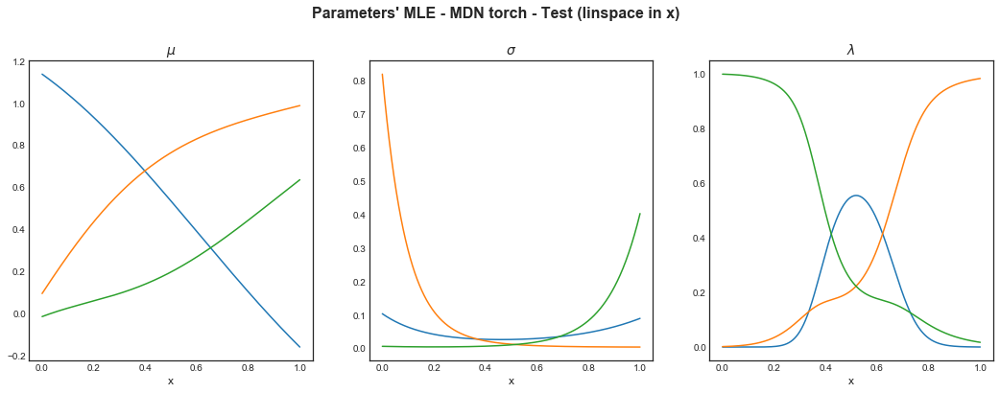

In [103]:
# extract posteriors - test
x_test_lin = np.linspace(0, 1, len(df_12many))
x_var_test = Variable(torch.from_numpy(np.float32(x_test_lin).reshape(-1, 1)))
mu_var_test, sigma_var_test, lam_var_test = mdn_torch(x_var_test)

mu_test = mu_var_test.data.numpy()
sigma_test = sigma_var_test.data.numpy()
lam_test = lam_var_test.data.numpy()

# plot MLE against x
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
plt.suptitle('Parameters\' MLE - MDN torch - Test (linspace in x)', fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.85)

ax[0].plot(x_test_lin, mu_test)
ax[1].plot(x_test_lin, sigma_test)
ax[2].plot(x_test_lin, lam_test)

ax[0].set_title(r'$\mu$', fontsize=14)
ax[1].set_title(r'$\sigma$', fontsize=14)
ax[2].set_title(r'$\lambda$', fontsize=14)    
ax[0].set_xlabel('x', fontsize=12)
ax[1].set_xlabel('x', fontsize=12)
ax[2].set_xlabel('x', fontsize=12)
plt.show()

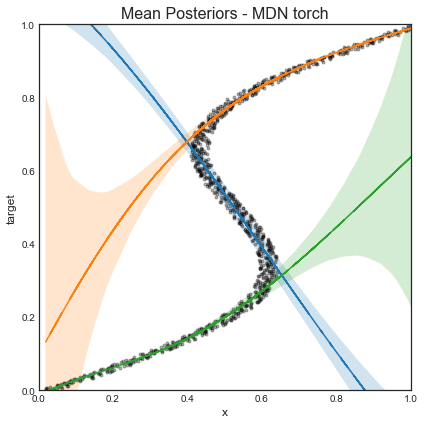

In [116]:
fig, ax = plt.subplots(figsize = (6, 6))
df_12many.plot(x='x', y='target', marker='.', linestyle='', c='k', alpha=0.3, ax=ax, legend=False)
for mu_k, sigma_k in zip(mu_train.T, sigma_train.T):
    ax.plot(df_12many['x'], mu_k)
    ax.fill_between(df_12many['x'], mu_k - sigma_k, mu_k + sigma_k, alpha=0.2)
    
ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('target', fontsize=12)
ax.set_title('Mean Posteriors - MDN torch', fontsize=16)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.tight_layout()

**B4**: Sample from the sampling distributions at the estimated point values of $\mu$ and $\sigma$ (given cluster) to make a plot similar to A5 above

**To think but not to hand in** What are the differences between a mixture density network and the mixture of experts. How do these differences translate to feature space? What would happen if we took the shared hidden layer nonlinearity (Tanh) out?

In [107]:
k_mdn_torch = gumbel_sample(lam_train)
indices = (np.arange(len(df_12many)), k_mdn_torch)
rvn = np.random.randn(len(df_12many))

df_pp_mdn_torch = pd.DataFrame(data={
    'group': k_mdn_torch,
    'x': df_12many['x'],
    'target': mu_train[indices] + sigma_train[indices] * rvn
})
df_pp_mdn_torch.head()

,group,target,x
0,2,-0.010439,0.018727
1,2,0.023509,0.050424
2,2,0.012141,0.042375
3,2,0.005619,0.038596
4,2,0.002712,0.019352


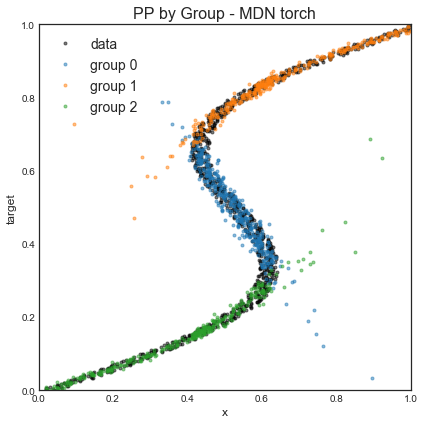

In [108]:
fig, ax = plt.subplots(figsize = (6, 6))
df_12many.plot(x='x', y='target', marker='.', linestyle='', c='k', label='data', alpha=0.5, ax=ax)
for i in range(3):
    df_group = df_pp_mdn_torch.set_index('group').loc[i, ['x', 'target']]
    df_group.plot(x='x', y='target', marker='.',linestyle='', alpha=0.5, label='group {}'.format(i), ax=ax)

ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('target', fontsize=12)
ax.legend(fontsize=14)
ax.set_title('PP by Group - MDN torch', fontsize=16)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.tight_layout()

## Part C Variational Mixture Density Network

We want to implement the Mixture Density Metwork model that we constructed in Part B  directly in pymc3 and use variational inference to sample from it. We  may need more iterations in order to get convergence as this model will likely not converge as fast as the pytorch equivalent.

**C1**: Write out the equivalent pymc3 version of the MDN and generate posterior samples with ADVI.

<font color='blue'>
We referenced this [example](https://docs.pymc.io/notebooks/bayesian_neural_network_advi.html) from pymc's documentation.
</font>

In [109]:
def construct_mdn_pymc(ann_in, ann_out, n_hidden, n_gaussians):
    with Model() as nn:
        # input layer
        w_ih = pm.Normal('w_ih', 0, sd=1, shape=(1, n_hidden))
        b_ih = pm.Normal('b_ih', 0, sd=1, shape = (1, n_hidden))
        
        # tanh activation after the input layer
        act_ih = pm.math.tanh(b_ih + pm.math.dot(ann_in, w_ih))
        
        # means
        w_mu = pm.Normal('w_mu', 0, sd=1, shape = (n_hidden, n_gaussians))
        b_mu = pm.Normal('b_mu', 0, sd=1, shape = (1, n_gaussians))
        mu = pm.Deterministic('mu', b_mu + pm.math.dot(act_ih, w_mu))
        
        # sigmas
        w_sigma = pm.Normal('w_sigma', 0, sd=1, shape = (n_hidden, n_gaussians))
        b_sigma = pm.Normal('b_sigma', 0, sd=1, shape = (1, n_gaussians))
        sigma = pm.Deterministic('sigma', pm.math.exp(b_sigma + pm.math.dot(act_ih, w_sigma)) + 0.01)
        
        # weights
        w_lam = pm.Normal('w_lam', 0, sd=1, shape = (n_hidden, n_gaussians))
        b_lam = pm.Normal('b_lam', 0, sd=1, shape = (1, n_gaussians))
        lam = pm.Deterministic('lam', tt.nnet.softmax(b_lam + pm.math.dot(act_ih, w_lam)))
        
        Y = pm.NormalMixture('Y', w=lam, mu=mu, sd=sigma, observed=ann_out)
    
    return nn

In [110]:
mdn_pymc = construct_mdn_pymc(df_12many[['x']].values, df_12many['target'].values, n_hidden=20, n_gaussians=3)

In [111]:
with mdn_pymc:
    inference = pm.ADVI()
    approx_mdn_pymc = pm.fit(n=100000, method=inference, obj_optimizer=pm.adam())

Average Loss = -1,392: 100%|██████████| 100000/100000 [04:21<00:00, 383.01it/s] 
Finished [100%]: Average Loss = -1,391.8


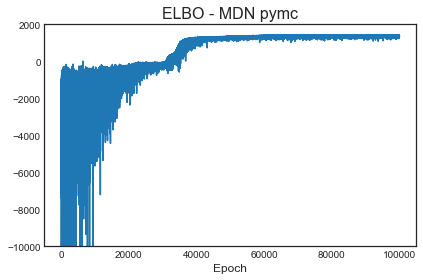

In [112]:
plt.plot(-approx_mdn_pymc.hist)
plt.title('ELBO - MDN pymc', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.ylim(-10000, 2000)
plt.tight_layout()

<font color='blue'>
**C1**
<br>
The ELBO curve remains stable after around 60,000 epochs.

**C2**: Sample from the posterior predictive and produce a diagram like B4 and A5 for this model. Plot traces of the mu/sigma/lambda as an aid in debugging your sampler.

In [113]:
# draw samples
tr_mdn_pymc = approx_mdn_pymc.sample(10000) 

# extract posteriors
mu_post_mdn_pymc = tr_mdn_pymc['mu']
sigma_post_mdn_pymc = tr_mdn_pymc['sigma']
lam_post_mdn_pymc = tr_mdn_pymc['lam']

In [114]:
k_mdn_pymc = gumbel_sample(lam_post_mdn_pymc.mean(axis=0))
indices = (np.arange(len(df_12many)), k_mdn_pymc)
rvn = np.random.randn(len(df_12many))

df_pp_mdn_pymc = pd.DataFrame(data={
    'group': k_mdn_pymc,
    'x': df_12many['x'],
    'target': mu_post_mdn_pymc.mean(axis=0)[indices] + sigma_post_mdn_pymc.mean(axis=0)[indices] * rvn
})
df_pp_mdn_pymc.head()

,group,target,x
0,0,-0.010614,0.018727
1,0,0.009433,0.050424
2,0,0.026995,0.042375
3,0,0.017587,0.038596
4,0,-0.001990,0.019352


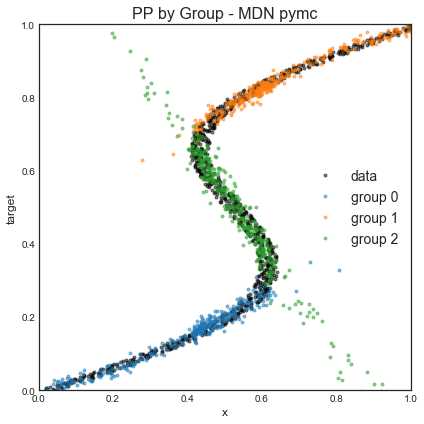

In [115]:
fig, ax = plt.subplots(figsize = (6, 6))
df_12many.plot(x='x', y='target', marker='.', linestyle='', c='k', label='data', alpha=0.5, ax=ax)
for i in range(3):
    df_group = df_pp_mdn_pymc.set_index('group').loc[i, ['x', 'target']]
    df_group.plot(x='x', y='target', marker='.',linestyle='', alpha=0.5, label='group {}'.format(i), ax=ax)

ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('target', fontsize=12)
ax.legend(fontsize=14)
ax.set_title('PP by Group - MDN pymc', fontsize=16)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.tight_layout()

**C3**: Plot the "mean" regression curves (similar to B3 and A3). Do the "mean" regression curves in this model look the same from those in Part B?  If they differ why so?

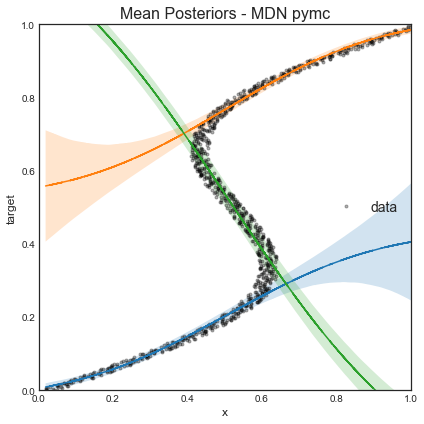

In [117]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
df_12many.plot(x='x', y='target', marker='.', linestyle='', c='k', label='data', alpha=0.3, ax=ax)

for i in range(3):
    m = mu_post_mdn_pymc.mean(axis=0)[:, i]
    s = sigma_post_mdn_pymc.mean(axis=0)[:, i]
    ax.plot(df_12many['x'], m)
    ax.fill_between(df_12many['x'], m - s, m + s, alpha=0.2)

ax.set_xlabel('x', fontsize=12)
ax.set_ylabel('target', fontsize=12)
ax.legend(fontsize=14)
ax.set_title('Mean Posteriors - MDN pymc', fontsize=16)
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.tight_layout()

<font color='blue'>
**C3**
    
- The regression curves (mean posteriors) given by the variational MDN has a narrower standard deviation than the normal MDN. This is because a normal MDN optimizes over the observed training data while variational inference optimizes over posterior samples. Since using a normal prior is essentially adding regularization to the model, variational inference is less prone to overfitting. Therefore, a fitted MDN has much lower confidence on the region of unseen data than its variational counterpart.

- Variational Inference is an approximate solution, and the stochasticity of the model could lead to different results for different runs.    

## Q3:  Exploring Temperature in Sampling and Optimiztion

At various times in class we've discussed in very vague terms the relation between "temperature" and sampling from or finding optima of distributions.  Promises would invariably be made that at some later point we'd discuss the concept of temperature and sampling/optima finding in more detail.  Let's take this problem as an opportunity to keep our promise.

Let's start by considering the function $f(x, y)$ defined in the following code cell. $f(x, y)$ is a mixture of three well separated Gaussian probability densities.

In [2]:
make_cov = lambda theta: np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])

theta_vec = (5.847707364986893, 5.696776968254305, 1.908095937315489)
theta1, theta2, theta3 = theta_vec

# parameters for gaussian mixtures
cov1 = make_cov(theta1)
sigma1 = np.array([[2, 0],[0, 1]])
m1 = [12, 7]
c1 = cov1@sigma1@cov1.T

cov2 = make_cov(theta2)
sigma2 = np.array([[1, 0],[0, 3]])
m2 = [-1, 6]
c2 = cov2@sigma2@cov2.T

cov3 = make_cov(theta3)
sigma3 = np.array([[.4, 0],[0, 1.3]])
m3 = [3, -2]
c3 = cov3@sigma3@cov3.T

# define gaussian mixture
mvn1 = multivariate_normal(m1, c1)
mvn2 = multivariate_normal(m2, c2)
mvn3 = multivariate_normal(m3, c3)

f = lambda xvec: mvn1.pdf(xvec) + mvn2.pdf(xvec) + .5*mvn3.pdf(xvec)

# p = lambda x, y: f([x,y])

## Part A Visualization and Metropolis

**A1**. Visualize $p(x, y)$ with a contour or surface plot.  Make sure to title your plot and label all axes.  What do you notice about $p(x, y)$?  Do you think it will be an easy function to sample?

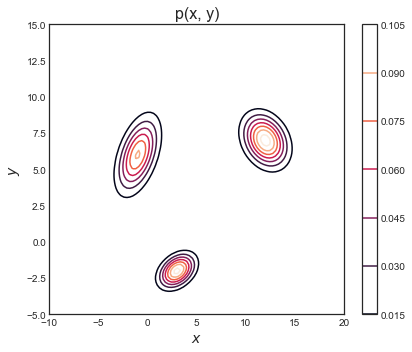

In [3]:
# domain
nx = ny = 100
x_lin = np.linspace(-10, 20, nx)
y_lin = np.linspace(-5, 15, ny)
x_grid, y_grid = np.meshgrid(x_lin, y_lin)
xy_grid = np.concatenate([x_grid.reshape((nx, nx, 1)), y_grid.reshape((ny, ny, 1))], axis=2)
p_grid = f(xy_grid)

# contour plot
plt.subplots(figsize = (6, 5))
plt.contour(x_grid, y_grid, p_grid)
plt.colorbar()
plt.title('p(x, y)', fontsize=16)
plt.xlabel(r'$x$', fontsize=14)
plt.ylabel(r'$y$', fontsize=14)
plt.tight_layout()

<font color='blue'>
**A1**
<br>
This distribution is hard to sample from because the 3 mixing Gaussians are well seperated.

**A2**. Generate 20000 samples from $p(x, y)$ using the Metropolis algorithm.  Pick individual gaussian proposals in $x$ and $y$ with $\sigma=1$, initial values, burnin parameters, and thinning parameter.  Plot traceplots of the $x$ and $y$ marginals as well as autocorrelation plots.  Plot a pathplot of your samples.  Based on your visualizations, has your Metropolis sampler generated an appropriate representation of the distribution $p(x, y)$?

A pathplot is just your samples trace overlaid on your pdf, so that you can see how the sampler traversed. It looks something like this:

![](images/pathplot.png)

In [4]:
def plot_autocorr_trace(samples, var_names, maxlags=50):
    fig, ax = plt.subplots(2,2, figsize=(12, 4))
    trace_X1 = samples[:, 0]
    trace_X2 = samples[:, 1]
    
    ax[0,0].acorr(trace_X1 - np.mean(trace_X1), normed=True, maxlags=maxlags);
    ax[0,0].set_xlim([0, maxlags])
    ax[0,0].set_title('{} - Autocorrelation'.format(var_names[0]))
    ax[0,1].plot(trace_X1, alpha=0.3)
    ax[0,1].set_title('{} - Trace'.format(var_names[0]))
    
    ax[1,0].acorr(trace_X2 - np.mean(trace_X2), normed=True, maxlags=maxlags);
    ax[1,0].set_xlim([0, maxlags])
    ax[1,0].set_title('{} - Autocorrelation'.format(var_names[1]))
    ax[1,1].plot(trace_X2, alpha=0.3)
    ax[1,1].set_title('{} - Trace'.format(var_names[1]))
    plt.tight_layout()
    
def plot_pathplot(x_grid, y_grid, p_grid, samples):
    plt.subplots(figsize=(6, 5))
    plt.plot(samples[:, 0], samples[:, 1], alpha=0.3)
    plt.plot([samples[-1, 0]], [samples[-1, 1]], marker='x', markersize=10, color='red')
    plt.contour(x_grid, y_grid, p_grid)
    plt.tight_layout()

def q_draw(current, m, c): 
    return multivariate_normal.rvs(mean=current+m, cov=c)

def metropolis(p, q_draw, m, c, N, start, burnin=0.1, thin=2):
    samples = np.empty((N, 2))
    x_prev = start
    accepted = np.zeros((N,))
    
    for i in range(N):
        x_star = q_draw(x_prev, m, c)
        p_star = p(x_star)
        p_prev = p(x_prev)
        pdf_ratio = p_star / p_prev
        if np.random.uniform() < min(1, pdf_ratio):
            samples[i, :] = x_star
            x_prev = x_star
            accepted[i] = 1
        else:
            samples[i, :] = x_prev
        if i % 100 == 0:
            print('i = {}'.format(i), end='\r')
            
    # throw away burnin and thin
    samples = samples[int(burnin*N)::thin]
    accepted_count = np.sum(accepted[int(burnin*N)::thin])
            
    return samples, accepted_count/len(samples)


In [9]:
target_N = 20000
burnin = 0.1
thin = 2
N = int((target_N * thin) / (1 - burnin))

m = np.array([0, 0])
c = np.array([[1**2, 0], [0, 1**2]])

samples_Q3_a, accp_Q3_a = metropolis(f, q_draw, m, c, N, [15, -5], burnin=burnin, thin=thin)

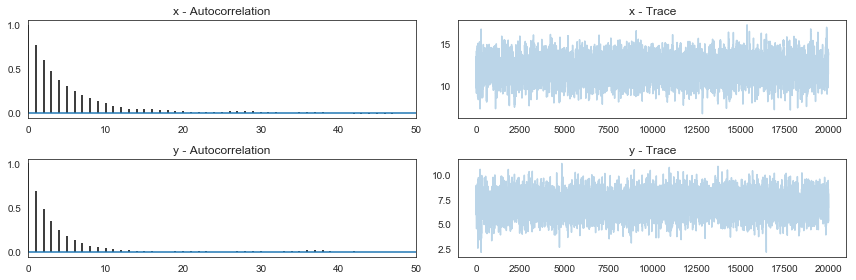

In [10]:
plot_autocorr_trace(samples_Q3_a, ['x', 'y'])

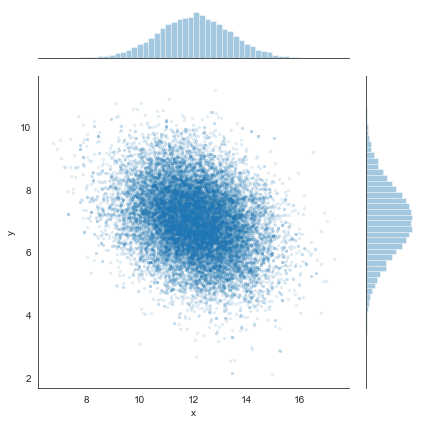

In [11]:
sns.jointplot('x', 'y', pd.DataFrame(samples_Q3_a, columns=['x', 'y']), cmap='Blues', alpha=0.1, s=5)
plt.tight_layout()

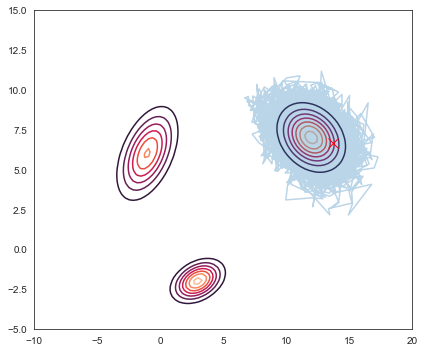

In [12]:
plot_pathplot(x_grid, y_grid, p_grid, samples_Q3_a)

<font color='blue'>
**A2**
<br>
Based on the above plots, our Metropolis sampler only covered 1 of the 3 Gaussians, and thus did not generate an appropriate representation of the distribution.

## Part B: Changing pdfs using temperature

Given a function $p(x)$ we can rewrite that function in following way:

$$p(x) = e^{-(-\log(p(x))}$$

So if define the energy density for a function as $E(x)\equiv-\log{p(x)}$

We can now aim to sample from the function parameratized by a Temperature $T$.

$$p(x\vert T) = e^{-\frac{1}{T} E(x)} = p(x)^{\frac{1}{T}}$$

If we set T=1 we're sampling from our original function $p(x)$. 

**B1** In line with A1, visualize modified pdfs (dont worry about normalization) by setting the temperatures to $T=10$ and $T=0.1$. 

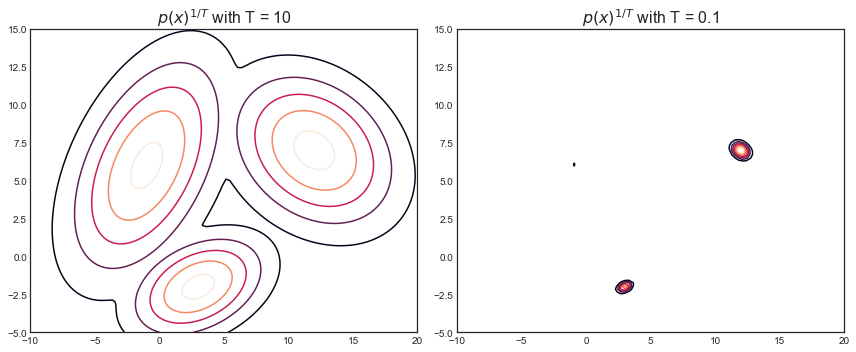

In [5]:
p_given_T = lambda xy, T: np.power(f(xy), (1/T))

p_grid_given_T1 = p_given_T(xy_grid, 10)
p_grid_given_T2 = p_given_T(xy_grid, 0.1)

# plot
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].contour(x_grid, y_grid, p_grid_given_T1);
ax[0].set_title(r'$p(x)^{1/T}$ with T = 10', fontsize=16)

ax[1].contour(x_grid, y_grid, p_grid_given_T2);
ax[1].set_title(r'$p(x)^{1/T}$ with T = 0.1', fontsize=16)

plt.tight_layout()

**B2**. Modify your Metropolis algorithm above to take a temperature parameter `T` as well as to keep track of the number of rejected proposals.  Generate 20000 samples from $p(x, y)$ at for each of the following temperatures: {0.1, 1, 3, 7, 10}. Construct  histograms of the marginals, traceplots, autocorrelation plots, and a pathplot for your samples at each temperature.  What happens to the number of rejections as temperature increases? In the limits $T \rightarrow 0$ and $T \rightarrow \infty$ what do you think your samplers will do?

In [10]:
def modified_metropolis(p, q_draw, m, c, N, start, T, burnin=0.1, thin=2, verbose=True):
    samples = np.empty((N, 2))
    x_prev = start
    accepted = np.zeros((N,))
    
    for i in range(N):
        x_star = q_draw(x_prev, m, c)
        p_star = p(x_star, T)
        p_prev = p(x_prev, T)
        pdf_ratio = p_star / p_prev
        if np.random.uniform() < min(1, pdf_ratio):
            samples[i, :] = x_star
            x_prev = x_star
            accepted[i] = 1
        else:
            samples[i, :] = x_prev
        if verbose:
            if i % 100 == 0:
                print('i = {}'.format(i), end='\r')
            
    # throw away burnin and thin
    samples = samples[int(burnin*N)::thin]
    accepted_count = np.sum(accepted[int(burnin*N)::thin])
            
    return samples, accepted_count/len(samples)

In [15]:
Ts = [0.1, 1, 3, 7, 10]
acceptance_Q3_b_arr = []
reject_Q3_b_arr = []
samples_Q3_b_arr = []
p_grid_given_T_arr = []

for T in Ts:
    print('T = {}'.format(T))
    samples_Q3_b, accp_Q3_b = modified_metropolis(p_given_T, q_draw, m, c, N, [15, -5], T, burnin=burnin, thin=thin)
    
    samples_Q3_b_arr.append(samples_Q3_b)
    acceptance_Q3_b_arr.append(accp_Q3_b)
    reject_Q3_b_arr.append(1-accp_Q3_b)
    p_grid_given_T_arr.append(p_given_T(xy_grid, T))

    print('rejection rate = {}'.format(1-accp_Q3_b))
    print('======================')
    

T = 0.1
rejection rate = 0.8853
T = 1
rejection rate = 0.5178499999999999
T = 3
rejection rate = 0.2501
T = 7
rejection rate = 0.1533
T = 10
rejection rate = 0.13465000000000005


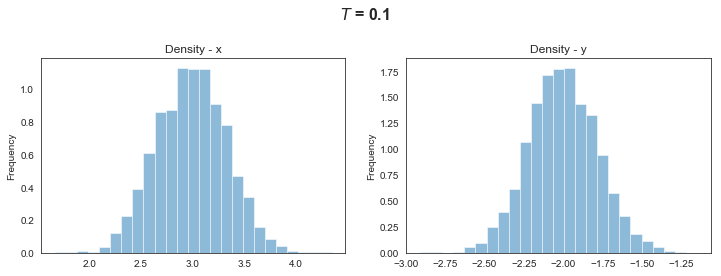

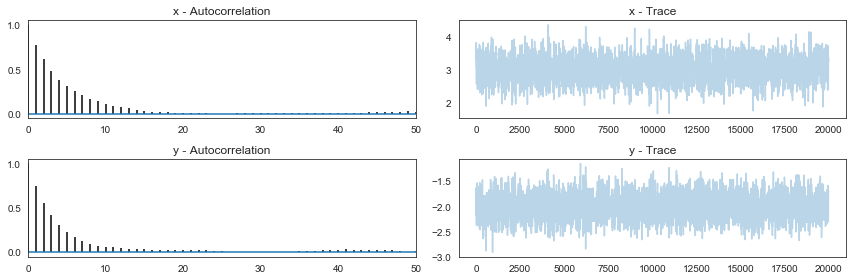

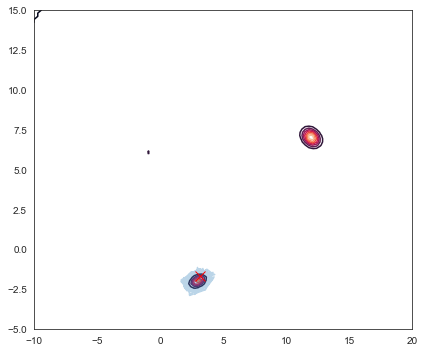

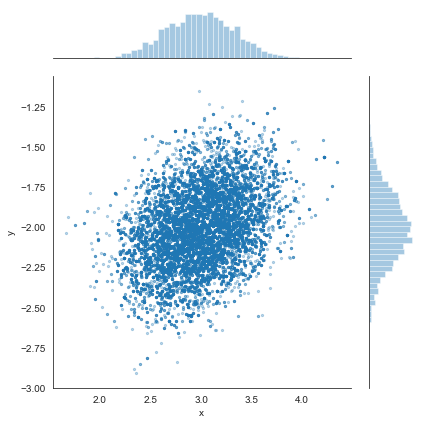

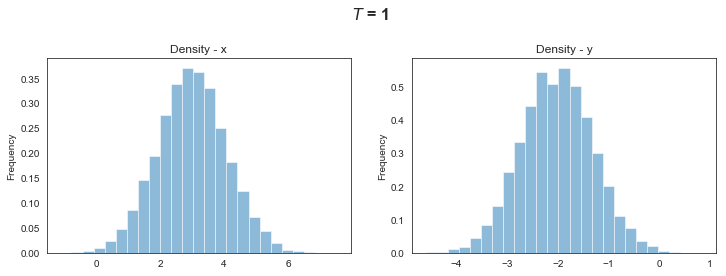

...

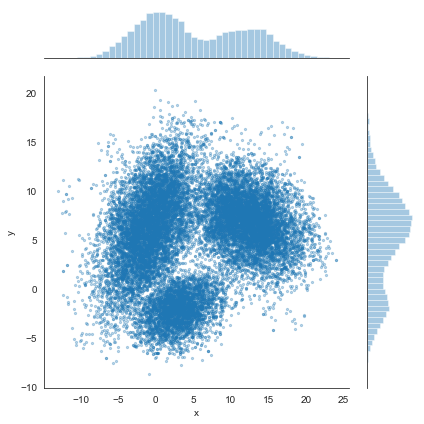

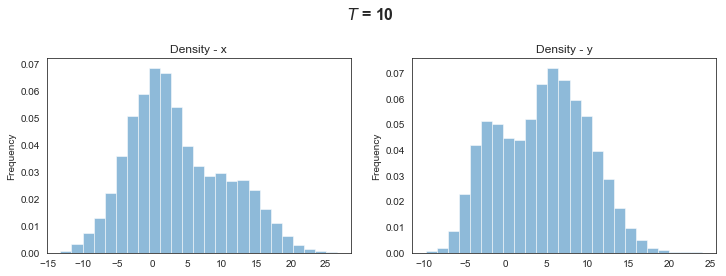

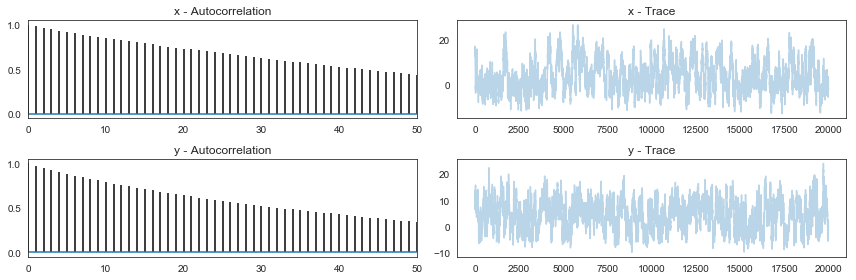

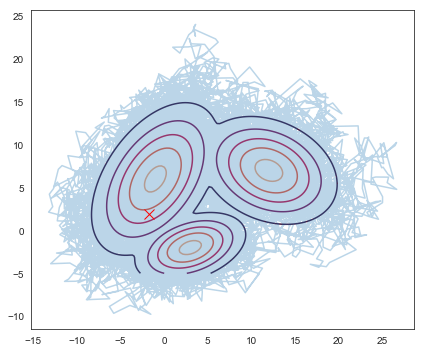

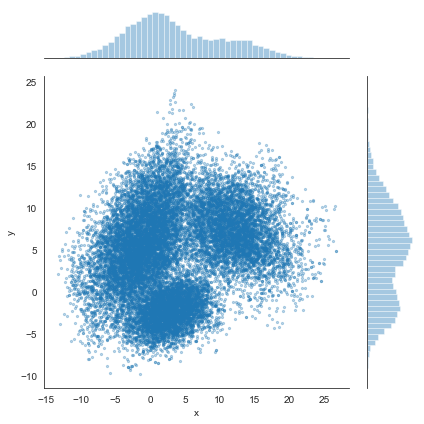

In [16]:
for i, T in enumerate(Ts):
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))
    plt.suptitle(r'$T$ = {}'.format(T), fontsize=16, weight='heavy')
    plt.subplots_adjust(top=0.8)
    
    # x, y marginal densities
    pd.Series(samples_Q3_b_arr[i][:, 0]).plot(kind='hist', density=True, alpha=0.5, bins=25, ax=ax[0], title='Density - x')
    pd.Series(samples_Q3_b_arr[i][:, 1]).plot(kind='hist', density=True, alpha=0.5, bins=25, ax=ax[1], title='Density - y')
    
    # autocorrelation & trace plots
    plot_autocorr_trace(samples_Q3_b_arr[i], ['x', 'y'])
    
    # pathplot
    plot_pathplot(x_grid, y_grid, p_grid_given_T_arr[i], samples_Q3_b_arr[i])
    
    # scatter plot of samples
    sns.jointplot('x', 'y', data=pd.DataFrame(samples_Q3_b_arr[i], columns=['x', 'y']), 
                  cmap='Blues', alpha=0.3, s=5)
    
    plt.tight_layout()

<font color='blue'>
**B2**  
<br>
As T increases, the rejection rate decreases.
    
- As $T \rightarrow 0$, rejection rate approaches 100%, samplers only generate samples at current states.

- As $T \rightarrow \infty$, rejection rate approaches 0%, samplers will generate samples everywhere.

The reason is that increasing temperature flattens the probability density, so the probability difference between samples dimishes at higher temperatures, thereby increasing acceptance rate.


**B3**. Approximate the $f(X)$ by the appropriate mixture of Gaussians as a way of generating samples from $f(X)$ to compare with other sampling methods.  Use scipy.stats.multivariate_normal to generate 20000 samples.  How do the histograms compare with the histograms for the samples from $f(X)$ at each temperature.  At what temperature do the samples best represent the function? 

In [17]:
def sample_mixture(T, n):
    samples = np.empty([n, 2])
    for i in range(n):
        # sample from the 3-Gaussian Mixture
        k = np.random.choice([0, 1, 2], p = [0.4, 0.4, 0.2])
        if k == 0:
            s= multivariate_normal.rvs(m1, T*c1)
        elif k == 1:
            s= multivariate_normal.rvs(m2, T*c2)
        else:
            s= multivariate_normal.rvs(m3, T*c3)
        
        # record samples
        samples[i, :] = s
        
    return samples

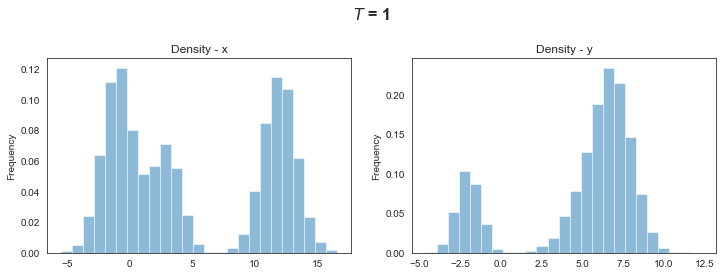

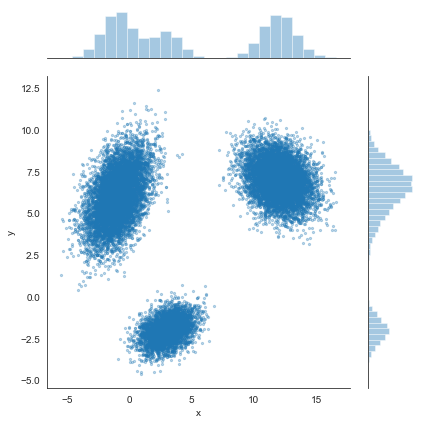

In [22]:
print('Mixture of Gaussians T = {}'.format(1), end='\r')
samples_mix = sample_mixture(1, 20000)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
plt.suptitle(r'$T$ = {}'.format(1), fontsize=16, weight='heavy')
plt.subplots_adjust(top=0.8)

# x, y marginal densities
pd.Series(samples_mix[:, 0]).plot(kind='hist', density=True, alpha=0.5, bins=25, ax=ax[0], title='Density - x')
pd.Series(samples_mix[:, 1]).plot(kind='hist', density=True, alpha=0.5, bins=25, ax=ax[1], title='Density - y')

# scatter plot of samples
sns.jointplot('x', 'y', data=pd.DataFrame(samples_mix, columns=['x', 'y']), 
              cmap='Blues', alpha=0.3, s=5)

plt.tight_layout()

<font color='blue'>
**B3**
<br>
A metropolis sampler at lower temperatures might not traverse to all the clusters. This is because the distribution at lower temperatures have a narrower marginal distribution, and the clusters are more separated on a hyperplane. In addition, the proposed new draws from a metropolis sampler are more likely to be positioned around the current state, thus less likely to reach another cluster.
<br>  
On the other hand, a metropolis sampler at higher temperatures has a high probaibliy of reaching all clusters, for the same rationale on the opposite spectrum as the lower temperature case described above.
<br>

Our samples from metropolis at T = 3 is most comparable to samples from the true mixture Gaussian distribution and thus best represents the function.    


## Part C: Parallel Tempering

Now that we've seen some of the pproperties of sampling at higher temperatures, let's explore a way to incorporate the improved exploration of the *entire pdf* from sampling at higher temperatures while still getting samples that match our distribution.  We'll use a technique called *parallel tempering*.  

The general idea of parallel tempering is to simulate $N$ replicas of the original system of interest (in our case, a single Metropolis Hastings chain), each replica at a different temperature. The temperature of a Metropolis Hastings Markov Chain defines how likely it is to sample from a low-density part of the target distribution. The high temperature systems are generally able to sample large volumes of parameter space, whereas low temperature systems, while having precise sampling in a local region of parameter space, may become trapped around local energy minima/probability maxima. Parallel tempering achieves good sampling by allowing the chains at different temperatures to exchange complete configurations. Thus, the inclusion of higher temperature chains ensures that the lower temperature chains can access *all* the low-temperature regions of phase space: the higher temperatures help these chains make the jump-over.

Darren Wilkinson's blog post has a [good description](https://darrenjw.wordpress.com/2013/09/29/parallel-tempering-and-metropolis-coupled-mcmc/) of whats going on.

Here is the idea that you must implement.

There are $N$ replicas each at different temperatures $T_i$ that produce $n$ samples each before possibly swapping states.

We simplify matters by only swapping states at adjacent temperatures.  The probability of swapping any two instances of the replicas is given by

$$A = min\left(1, \frac{p_k(x_{k+1})p_{k+1}(x_k)}{p_k(x_k) p_{k+1}(x_{k+1})}\right)$$

One of the $T_i$'s in our set will always be 1 and this is the only replica that we use as output of the Parallel tempering algorithm.

An algorithm for Parallel Tempering is as follows:

1. Initialize the parameters $\{(x_{init}, y_{init})_i\}, \{T_i\}, L$ where 
    * $L$ is the number of iterations between temperature swap proposals.
    * $\{T_i\}$ is a list of temperatures.  You'll run one chain at each temperature.
    * $\{(x_{init}, y_{init})_i\}$ is a list of starting points, one for each chain 
2. For each chain (one per temperature) use the simple Metropolis code you wrote earlier. Perform $L$ transitions on each chain.
3. Set the $\{(x_{init}, y_{init})_i\}$ for the next Metropolis run on each chain to the last sample for each chain i.
4. Randomly choose 2 chains at adjacent temperatures.
    1. Use the above formula to calculate the Acceptance probability $A$.
    2. With probability $A$, swap the positions between the 2 chains (that is swap the $x$s of the two chains, and separately swap the $y$s of the chains .
5. Go back to 2 above, and start the next L-step epoch 
6. Continue until you finish $Num. Samples//L$ epochs.


**C1**. Explain why swapping states with the given acceptance probability is in keeping with detailed balance. The linked blog post might help.

<font color='blue'>
**C1**
<br>
The act of swapping states with the given acceptance probability is equivalent to the generation and acceptance of a new proposal sample in metropolis sampling. Therefore, swapping states with the given acceptance probability is in keeping with detailed balance.

**C2**. Create a parallel tempering sampler that uses 5 chains at  the temperatures {0.1, 1, 3, 7, 10} to sample from $f(x, y)$.  Choose a value of L around 10-20.  Generate 10000 samples from $f(x, y)$.  Construct  histograms of the marginals, traceplots, autocorrelation plots, and a pathplot for your samples.

In [24]:
target_N = 10000
burnin = 0.1
thin = 2
N = int((target_N * thin) / (1 - burnin))

m = np.array([0, 0])
c = np.array([[1**2, 0], [0, 1**2]])

L = 20
Ts = [0.1, 1, 3, 7, 10]
x_inits = [[15, -5], [15, -5], [15, -5], [15, -5], [15, -5]]
num_epochs = int(N/L)

reject_Q3_c_arr = []
samples_Q3_c_arr = [] 
x_inits_Q3_arr = []

for epoch in range(num_epochs):
    print('epoch: {}'.format(epoch), end='\r')
    epoch_reject_arr = []
    epoch_samples_arr = []
    new_x_inits = []
    
    # for each chain
    for idx, T in enumerate(Ts):
        samples, accp = modified_metropolis(p_given_T, q_draw, m, c, L, x_inits[idx], T, burnin=0, thin=1, verbose=False)
        epoch_samples_arr.append(samples)
        new_x_inits.append(samples[-1])
        epoch_reject_arr.append(1-accp)
    
    # store epoch result
    samples_Q3_c_arr.append(epoch_samples_arr)
    reject_Q3_c_arr.append(epoch_reject_arr)
    x_inits_Q3_arr.append(x_inits)
    
    # update x_stars to the last sample of each chain
    x_inits = new_x_inits
    
    # randomly choose 2 adjacent temperatures
    i = np.random.choice(5, 1)[0]
    j = 0
    if (i < 4) and (i > 0):
        j = np.random.choice([i+1, i-1], 1)[0]
    elif i == 0:
        j = 1
    elif i == 4:
        j = 3
        
    # calculate factor to determine the prob of accepting
    xi = x_inits[i]
    xj = x_inits[j]
    num = p_given_T(xj, Ts[i]) * p_given_T(xi, Ts[j])
    denom = p_given_T(xi, Ts[i]) * p_given_T(xj, Ts[j])
    factor = num / denom                    
    A = min(1, factor)
    if np.random.uniform() < A:
        x_inits[i] = xj
        x_inits[j] = xi
        
    

In [25]:
# extract data
samples_T0 = []
samples_T1 = []
samples_T2 = []
samples_T3 = []
samples_T4 = []
for epoch in range(num_epochs):
    samples_T0.extend(samples_Q3_c_arr[epoch][0])
    samples_T1.extend(samples_Q3_c_arr[epoch][1])
    samples_T2.extend(samples_Q3_c_arr[epoch][2])
    samples_T3.extend(samples_Q3_c_arr[epoch][3])
    samples_T4.extend(samples_Q3_c_arr[epoch][4])

# burnin and thin
samples_T0 = samples_T0[int(burnin*N)::thin]
samples_T1 = samples_T1[int(burnin*N)::thin]
samples_T2 = samples_T2[int(burnin*N)::thin]
samples_T3 = samples_T3[int(burnin*N)::thin]
samples_T4 = samples_T4[int(burnin*N)::thin]

final_samples = [samples_T0, samples_T1, samples_T2, samples_T3, samples_T4]

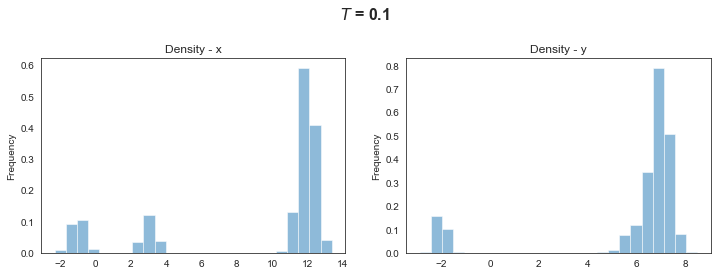

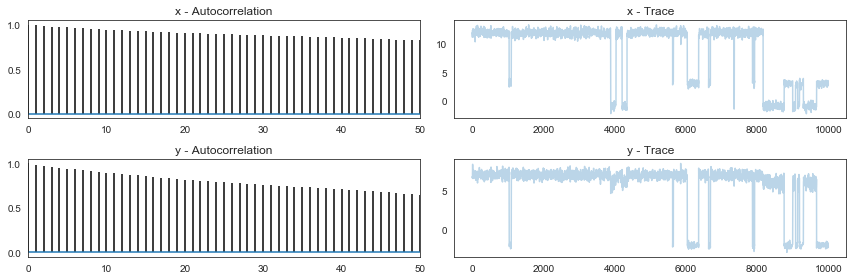

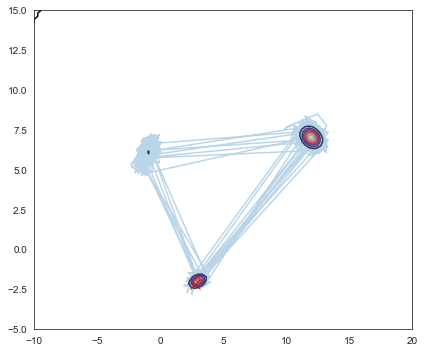

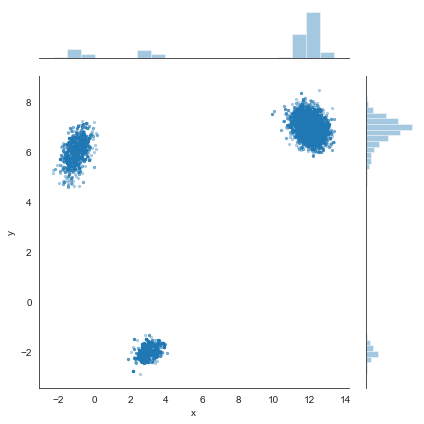

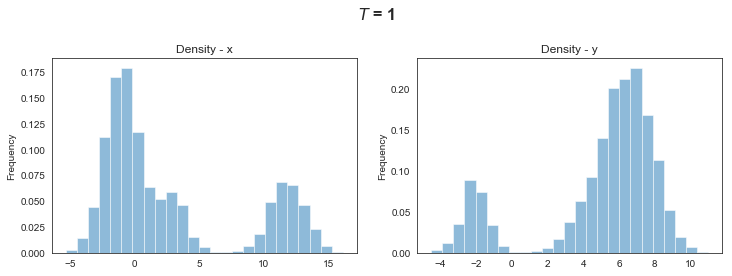

...

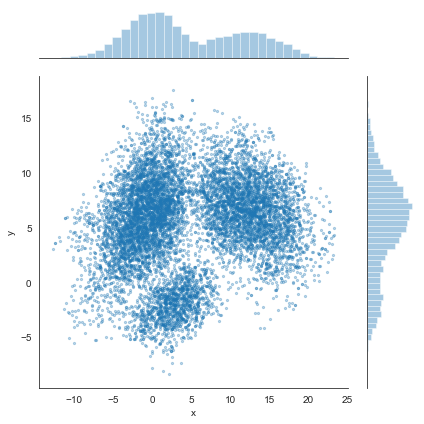

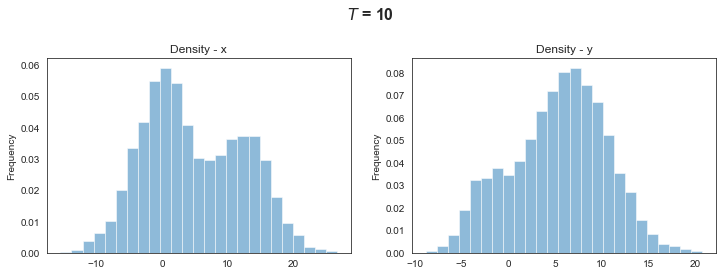

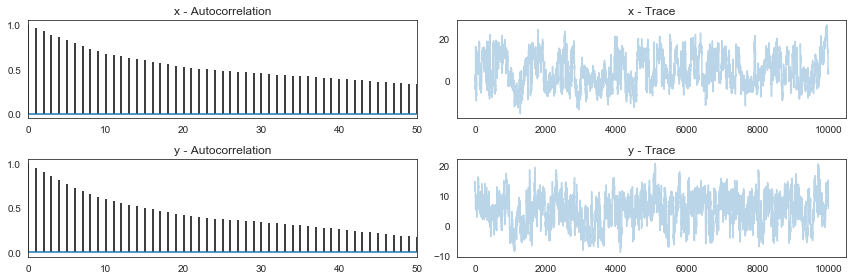

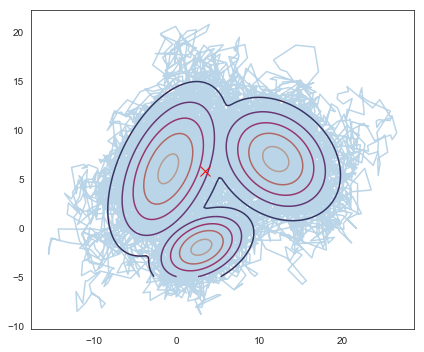

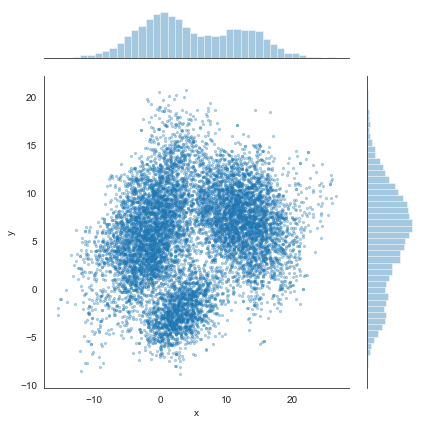

In [26]:
for i, samps in enumerate(final_samples):
    samps = np.array(samps)
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))
    plt.suptitle(r'$T$ = {}'.format(Ts[i]), fontsize=16, weight='heavy')
    plt.subplots_adjust(top=0.8)
    
    # x, y marginal densities
    pd.Series(samps[:, 0]).plot(kind='hist', density=True, alpha=0.5, bins=25, ax=ax[0], title='Density - x')
    pd.Series(samps[:, 1]).plot(kind='hist', density=True, alpha=0.5, bins=25, ax=ax[1], title='Density - y')
    
    # autocorrelation & trace plots
    plot_autocorr_trace(samps, ['x', 'y'])
    
    # pathplot
    plot_pathplot(x_grid, y_grid, p_grid_given_T_arr[i], samps)
    
    # scatter plot of samples
    sns.jointplot('x', 'y', data=pd.DataFrame(samps, columns=['x', 'y']), cmap='Blues', alpha=0.3, s=5)
    
    plt.tight_layout()

**C3**. How do your samples in **C2** compare to those of the Metropolis sampler?  How do they compare to the samples generated from the Gaussian Mixture approximation of $f(x, y)$?

<font color='blue'>
**C3**
<br>
Sampling at T = 1 is desirable because it reflects the true distribution. Therefore, we compare our samplers at T = 1. Compared to Metropolis sampler, parallel tempering is more likely to traverse to and sample from all 3 Gaussians at T = 1. It incorporates the advantages of sampling at high temperature which enables the sampler to sample wider ranges of parameter space, and sampling at low temperature which allows precise sampling in a local region of parameter space. Parallel tempering produces similar samples from the samples generated from the Gaussian Mixture approximation of $f(x,y)$ at T = 1.    


## Part D. Global Optima using Simulated Annealing

We have new-found intuition about how to use temperature to improve our sampling. Lets now tackle the inverse idea: what happens if you sample at a lower temperature than 1. Our visualizations from Part B should indicate to us that the distributions become extremely tightly peaked arounnd their maxima.

If we initialized a metropolis-hastings sampler around an optimum at a really low temperature, it would find us a local minimum. But if we had a higher temperature at the beginning, we can use Metropolis-Hastings sampling at high temperatures to travel around the distribution and find all the peaks (valleys).  Then we will slowly cool down the temperature (which will allow us to escape local optima at higher temperatures) and finally focus us into a particular optimum region and allow you to find the optimum. It can be shown that for ceratin *temperture schedules* this method is guaranteed to find us a global minimum in the limit of infinite iterations.

We'll use this methd to find the global minimum of our distribution. The algorithm is as follows. Now we have only one chain, but we very slowly dial down its temperature to below T=1.

1. Initialize $(x, y)_i,T, L(T)$ where $L$ is the number of iterations at a particular temperature. 
2. Perform $L$ transitions thus(we will call this an epoch):
    1. Generate a new proposed position $(x, y)_{\ast}$ using 2 independent gaussians with $\sigma=1$.
    2. If $(x, y)_{\ast}$ is accepted (according to probability $P = e^{(-\Delta E/T)}$, set $(x, y)_{i+1} = (x, y)_{\ast}$, else set $(x, y)_{i+1} = x_{i}$  
3. Update T and L 
4. Until some fixed number of epochs, or until some stop criterion is fulfilled, goto 2.

$\Delta E$ is the change in enery, or the change in the negative log of the probability function. That is, $E = -log p(x,y)$. For a given T and L, this is just Metropolis!

This algorithm is called *simulated annealing* and we'll use it to find the global maximum for $f(X)$

**D1**. Use simulated annealing with a cooling schedule of $T_{k+1}=0.98T_{k}$ and a L(T) defined initially at 100 with $L_{k+1} = 1.2 L_k$ to find the global optima for $p(x, y)$.  Plot $E(x, y)$ vs iterations.  Given how we constructed $p(x, y)$ it should be fairly straight-forward to observe the  true optima by inspection.  How does the optima found by SA compare to the true optima?

In [7]:
def get_N(L=100, epochs=50):
    N = 0
    L_tmp = L
    for epoch in range(epochs):
        N += L_tmp
        L_tmp = int(np.ceil((1.2 * L_tmp)))
    return N

def energy(x):
    return -np.log(p_given_T(x, T=1))

def simulated_annealing(p, m, c, N, start, epochs, L = 5, T = 20, burnin=0.1, thin=2):
    samples = []
    x_prev = start

    L_sum = 0
    E = []
    E_best = energy(x_prev)
    
    
    for epoch in range(epochs):
        rvs = multivariate_normal.rvs(m, c, size = L)
        for i in range(L):
            x_star = x_prev + rvs[i]
            
            E_star = energy(x_star)
            E_prev = energy(x_prev)
            
            if ((E_star < E_prev) or (np.random.uniform() < min(1, np.exp((E_prev - E_star)/T)))):
                x_prev = x_star
                if E_star < E_best:
                    E_best = E_star
                    T_best = T
                    x_best = x_star

            E.append(energy(x_prev))
            samples.append(x_prev)
                
        L_sum += L
        L = int(np.ceil(1.2 * L))
        T = 0.98 * T
        
        print('epoch = {}'.format(epoch), end='\r')
    
    print("Final T: ", T)
    best_meta = {}
    best_meta['T'] = T_best
    best_meta['E'] = E_best
    best_meta['x'] = x_best
    
    return samples, E, best_meta

In [8]:
T_init = 2.5
L_init = 100
num_epochs = 50
burnin = 0.1
thin = 2

m = np.array([0, 0])
c = np.array([[1**2, 0], [0, 1**2]])
N = get_N(L=L_init, epochs=num_epochs)
print("total number of samples:", N)

samples_sa, E_sa, best_meta = simulated_annealing(p_given_T, m, c, N, [10, -10], num_epochs, L_init, T_init)

total number of samples: 4591993
Final T:  0.9104242002177924


In [22]:
samps_sa1 = pd.DataFrame(samples_sa[:3]).values
samps_sa2 = pd.DataFrame(samples_sa[3:]).values

samps_sim_annealed = np.vstack([samps_sa1, samps_sa2])
samps_sim_annealed.shape

(4591993, 2)

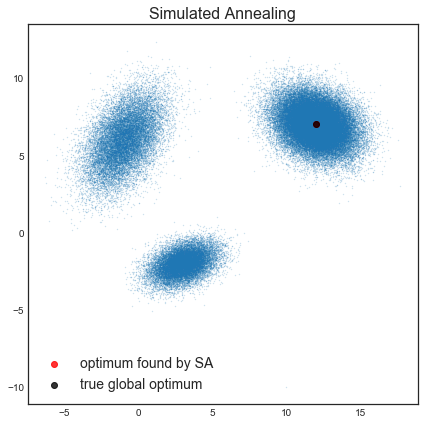

In [29]:
plt.subplots(figsize=(6, 6));
plt.scatter(samps_sim_annealed[::50, 0], samps_sim_annealed[::50, 1], s=0.1, alpha=0.3);
plt.scatter(best_meta['x'][0], best_meta['x'][1], color='r', label ='optimum found by SA', alpha=0.8)
plt.scatter(m1[0], m1[1], color='k', alpha=0.8, label='true global optimum')
plt.legend(fontsize=12)
plt.title('Simulated Annealing', fontsize=16)
plt.legend(fontsize=14)
plt.tight_layout()

In [30]:
print("The optimum found by Simulated Annealing: ", best_meta['x'])

The optimum found by Simulated Annealing:  [12.00130722  6.99986833]


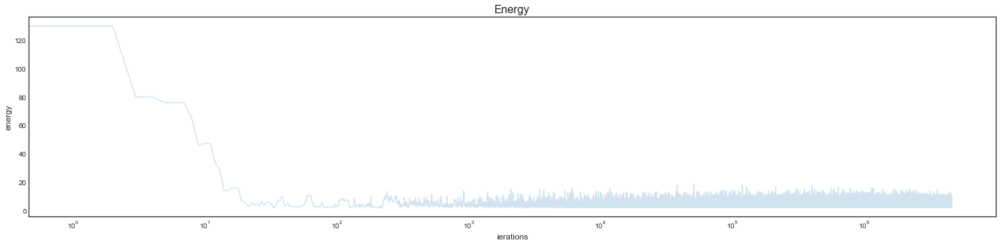

In [32]:
plt.subplots(figsize=(20, 5));
plt.plot(np.arange(len(E_sa)), E_sa, alpha=0.2)
plt.xscale('log')
plt.xlabel('iterations', fontsize=12)
plt.ylabel('energy', fontsize=12)
plt.title('Energy', fontsize=16)
plt.tight_layout()

<font color='blue'>
**D1**
<br>
The optimum found by simulated annealing is (12.00130722  6.99986833). This is essentially the same as the true global optimum (12, 7), which has the smallest covariance in those three Gaussians and thus has highest probability.

The energy drops down after around 100 samples. Simulated Annealing first travels to all the peaks at higher temperatures, then focuses onto a particular optimum region after cooling down. The cooling down is achieved by the temperature decay factor. Faster temperature decay allows a faster convergences to a stable energy state, but the sampler might not be able to traverse to all of the clusters.